In [1]:
import warnings
warnings.filterwarnings('ignore')
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = 'all'


from tqdm import tqdm

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

%matplotlib inline 

In [2]:
import mflow
from zdata import PdDataStats, ZPdDataset
import utilz, content, preprocess, extract
import report


from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, PowerTransformer , OneHotEncoder 
from sklearn.linear_model import LogisticRegression
from sklearn import svm 


# 1. Load Dataset

In [3]:
report.ZReporter.start("fundusEDA_31")


pdstats = PdDataStats(
                {PdDataStats.DATA_DICT_RECORDZ_KEY: content.STARE_FUNDUS_CONTENT_FPATH,
                PdDataStats.DATA_DICT_HAS_HEADERZ_KEY: True,
                'rec_parser': utilz.FileIO.row_parser                     
                },
                 ftype=PdDataStats.TYPE_TXT_LINES_FILE ) 

pdstats.dframe.describe() 

,fname,fpath,ishape,imin,imax,imean,istd,Normal,Emboli,BRAO,...,ASR,HTR,Coats,MA,CNV,UNDEF,dcodez_id,dcodez_short,dcodez_desc,dnotes
count,397,397,397,397,397,397,397,397,397,397,...,397,397,397,397,397,397,397,397,397,210
unique,397,397,1,2,17,397,397,2,2,2,...,2,2,2,2,2,2,48,48,48,75
top,im0286,/mnt/externz/zRepoz/datasets/fundus/stare/im03...,"(605, 700, 3)",0,255,94.83514285714286,91.12101625384672,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,14,UNDEF,Unknown Diagnosis,Choroidal Neovascularization AND Age Related M...
freq,1,1,397,371,373,1,1,358,384,390,...,364,361,383,389,336,239,90,90,90,33


In [4]:
dframe = pdstats.dframe
X_data = dframe  
y_data = dframe['Normal'].values.astype(np.float32) ##TODO: 'dcodez_short'
print("Loaded into PdFrame data of size: ", len(dframe) , " and into y_data of size ", len(y_data) )  
print( dframe.columns )
print("\n\n", len(X_data))

Loaded into PdFrame data of size:  397  and into y_data of size  397
Index(['fname', 'fpath', 'ishape', 'imin', 'imax', 'imean', 'istd', 'Normal',
       'Emboli', 'BRAO', 'CRAO', 'BRVO', 'CRVO', 'Hemi-CRVO', 'BDR-NPDR',
       'PDR', 'ASR', 'HTR', 'Coats', 'MA', 'CNV', 'UNDEF', 'dcodez_id',
       'dcodez_short', 'dcodez_desc', 'dnotes'],
      dtype='object')


 397


# 2. Pipelines and permutations

In [5]:
## 2. Data PIPELINEZ 
loader_p75 = [ ('fetch_img75', preprocess.LoadImageFileTransform('fpath', crop_ratio=0.75) ), ]
loader_p85 = [ ('fetch_img85', preprocess.LoadImageFileTransform('fpath', crop_ratio=0.85) ), ]
flattenor = [ ('flatten', preprocess.Flattenor()), ]
funduzor_1 = [ ('funduzor', extract.FundusColorChannelz() ),]
lbp_adder = [ ('lbp_add', extract.FundusAddLBP(1) ),]
scaler_p = [('scaler', StandardScaler()), ]
channelz_g_only = [('channelz_green',extract.ChannelzSelector( ls_channelz=(1,) ) )] 
channelz_grb = [('channelz_grb',extract.ChannelzSelector( ls_channelz=(1,2,3) ) )] 
channelz_lbp = [('channelz_lbp', extract.ChannelzSelector( ls_channelz=(0,2,3,4) ) )] 
channelz_lbp_grn = [('channelz_lbp_green', extract.ChannelzSelector( ls_channelz=(0,2) ) )] 


In [6]:
def fda_run(pipez, fdir, trainin_X=X_data):
    tmpz = Pipeline( pipez ).transform(trainin_X)
    _CLASSES = ['sick', 'okay']
    tz = ['lbp', 'vessel', 'green', 'red', 'blue',  'combo']
    for fp, norm, flbl, colrz_lbp in zip(trainin_X['fname'],trainin_X['Normal'], trainin_X['dcodez_short'], tmpz):
        c = colrz_lbp.shape[2]
        imgz = [ *[ colrz_lbp[:,:,i] for i in range(c) ], colrz_lbp[:,:,2:]]
        fn = _CLASSES[int(float(norm))]
        save_to = f"{fp}_{fn}__{flbl}" 
        print( save_to )
        utilz.Image.plot_images_list( imgz, titlez=tz, nc=c+2 , cmap='gray', 
                                     save= save_to, savedpi=1200,
                                        tdir=fdir)

im0001_sick__BDR-NPDR


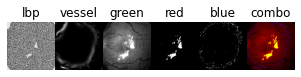

im0002_sick__CNV++ASR


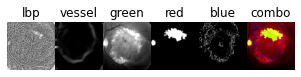

im0003_sick__UNDEF


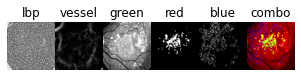

im0004_sick__UNDEF++CRAO


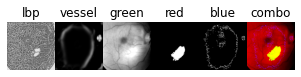

im0005_sick__CRAO++CRVO


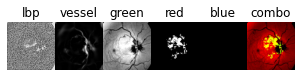

im0006_sick__UNDEF


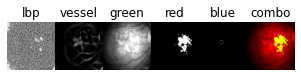

im0007_sick__CNV++UNDEF++ASR++HTR


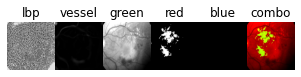

im0008_sick__CNV++UNDEF++ASR


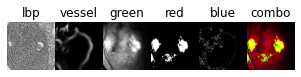

im0009_sick__BDR-NPDR


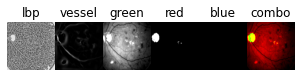

im0010_sick__UNDEF


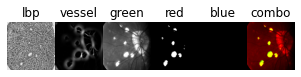

im0011_sick__CNV++UNDEF


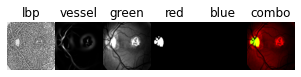

im0012_sick__UNDEF


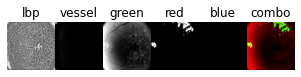

im0013_sick__BDR-NPDR


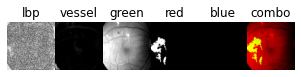

im0014_sick__UNDEF


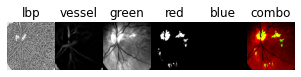

im0015_sick__UNDEF


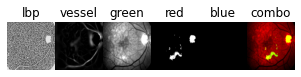

im0016_sick__BDR-NPDR


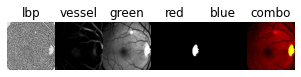

im0017_sick__CNV


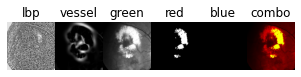

im0018_sick__CRVO


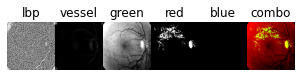

im0019_sick__CRVO


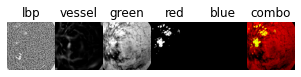

im0020_sick__CRAO++CRVO


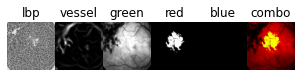

im0021_sick__PDR


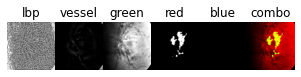

im0022_sick__ASR


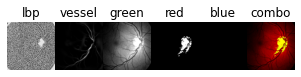

im0023_sick__UNDEF


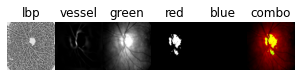

im0024_sick__UNDEF


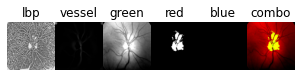

im0025_sick__CRVO++ASR


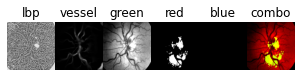

im0026_sick__CRVO


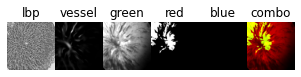

im0027_sick__CRVO


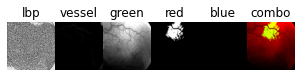

im0028_sick__Hemi-CRVO++ASR


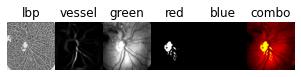

im0029_sick__UNDEF


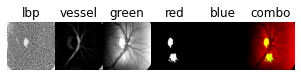

im0030_okay__Normal


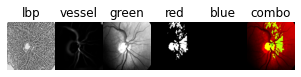

im0031_sick__BDR-NPDR


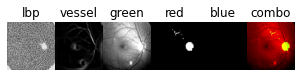

im0032_okay__Normal


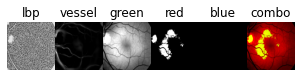

im0033_sick__CRVO


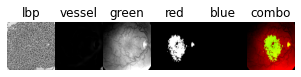

im0034_sick__CNV++UNDEF


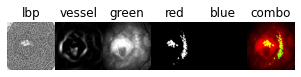

im0035_sick__UNDEF


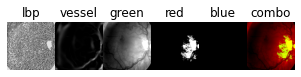

im0036_sick__CNV++UNDEF


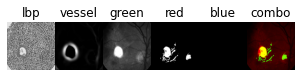

im0037_sick__CNV++UNDEF++HTR


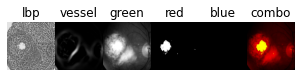

im0038_sick__BDR-NPDR++HTR


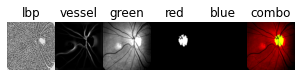

im0039_sick__UNDEF


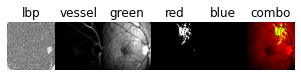

im0040_sick__BDR-NPDR


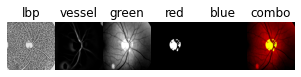

im0041_sick__UNDEF


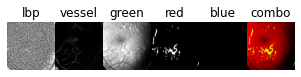

im0042_sick__UNDEF


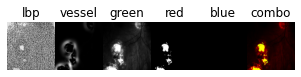

im0043_sick__UNDEF


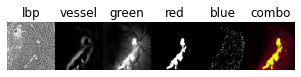

im0044_sick__UNDEF


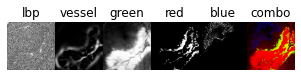

im0045_sick__CNV++UNDEF++ASR


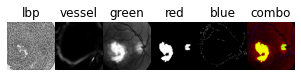

im0046_sick__UNDEF


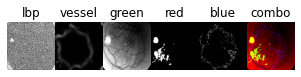

im0048_sick__HTR


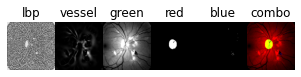

im0049_sick__Coats


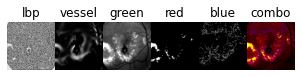

im0050_sick__BDR-NPDR


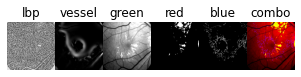

im0051_sick__BDR-NPDR


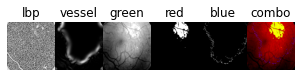

im0052_sick__Coats


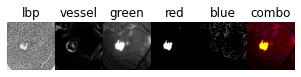

im0053_sick__CNV++UNDEF


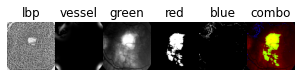

im0054_sick__CNV++UNDEF


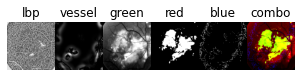

im0055_sick__UNDEF


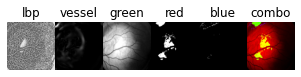

im0056_sick__UNDEF


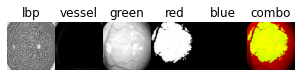

im0057_sick__HTR++BDR-NPDR


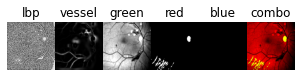

im0058_sick__BDR-NPDR


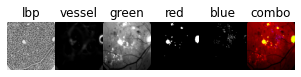

im0059_sick__BDR-NPDR++UNDEF


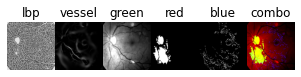

im0060_sick__BDR-NPDR


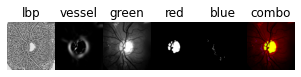

im0061_sick__CNV++UNDEF++HTR


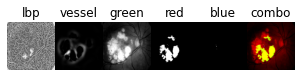

im0062_sick__CNV++UNDEF++ASR


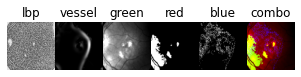

im0063_sick__UNDEF


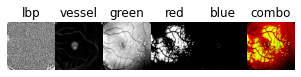

im0064_sick__MA++HTR++ASR


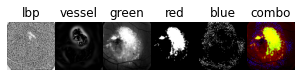

im0065_sick__HTR++BDR-NPDR


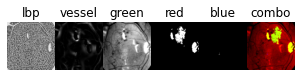

im0066_sick__UNDEF


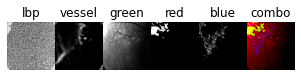

im0067_sick__UNDEF


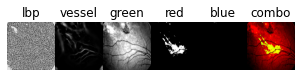

im0068_sick__UNDEF


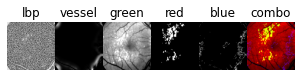

im0069_sick__BDR-NPDR


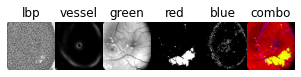

im0070_sick__BDR-NPDR


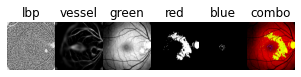

im0071_sick__UNDEF


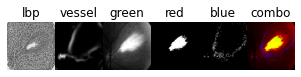

im0072_sick__UNDEF


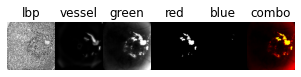

im0073_sick__HTR++ASR


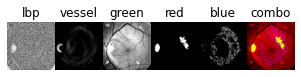

im0074_sick__CRVO


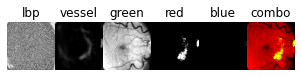

im0075_sick__HTR


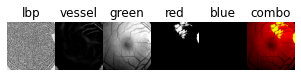

im0076_okay__Normal


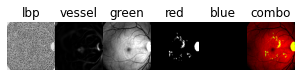

im0077_okay__Normal++HTR


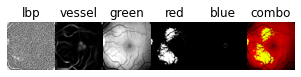

im0078_sick__UNDEF


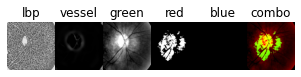

im0079_sick__UNDEF


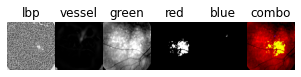

im0080_okay__Normal


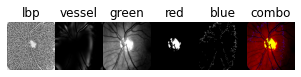

im0081_okay__Normal


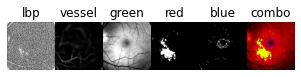

im0082_okay__Normal


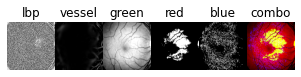

im0083_sick__CNV++UNDEF


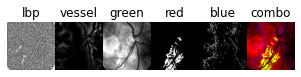

im0084_sick__CNV++UNDEF


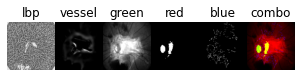

im0085_sick__PDR


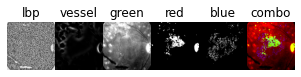

im0086_sick__UNDEF


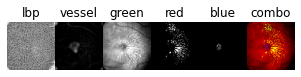

im0087_sick__PDR


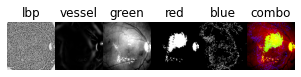

im0088_sick__UNDEF


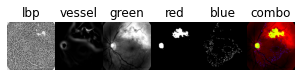

im0089_sick__BDR-NPDR++HTR


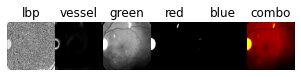

im0090_sick__HTR


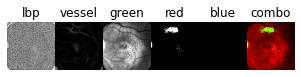

im0091_sick__CNV++UNDEF++UNDEF


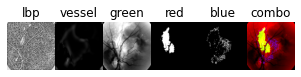

im0092_sick__CNV++UNDEF


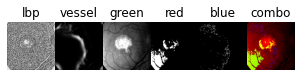

im0093_sick__Coats


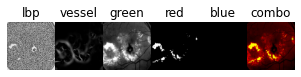

im0094_sick__BDR-NPDR++HTR


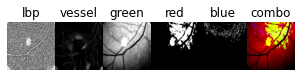

im0095_sick__BRVO


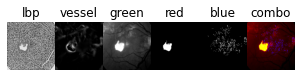

im0096_sick__BDR-NPDR


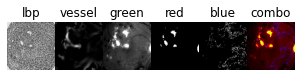

im0097_sick__UNDEF


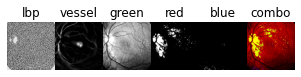

im0098_sick__UNDEF++HTR


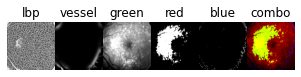

im0099_sick__UNDEF


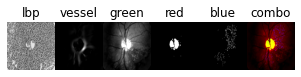

im0100_sick__CNV++UNDEF


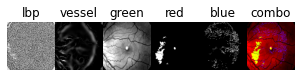

im0101_sick__CNV


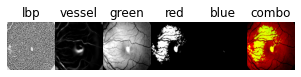

im0102_sick__UNDEF


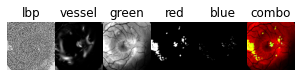

im0103_sick__CNV


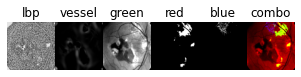

im0104_sick__CNV++UNDEF


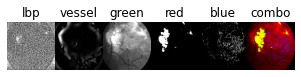

im0105_sick__CNV++UNDEF


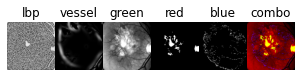

im0106_sick__CNV++UNDEF


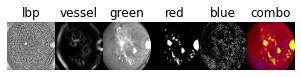

im0107_sick__UNDEF


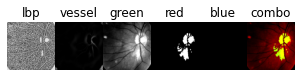

im0110_sick__CNV++UNDEF


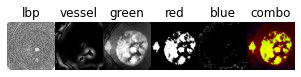

im0111_sick__BDR-NPDR++UNDEF


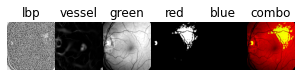

im0112_sick__UNDEF


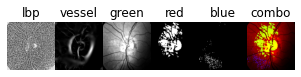

im0113_sick__BDR-NPDR


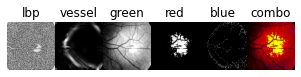

im0114_sick__BDR-NPDR


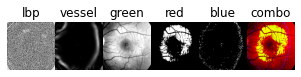

im0115_sick__BDR-NPDR


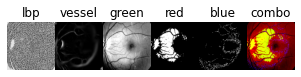

im0116_sick__BDR-NPDR


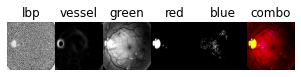

im0117_sick__BDR-NPDR++ASR


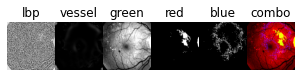

im0118_sick__BDR-NPDR++ASR


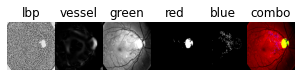

im0119_okay__Normal


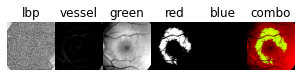

im0120_okay__Normal


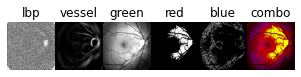

im0121_sick__BDR-NPDR


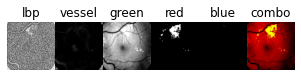

im0122_sick__BDR-NPDR


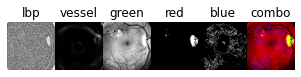

im0123_sick__BDR-NPDR


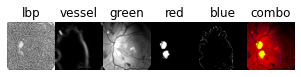

im0124_sick__BDR-NPDR


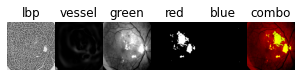

im0125_sick__BDR-NPDR


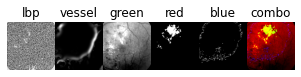

im0126_sick__BDR-NPDR


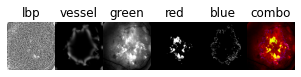

im0127_sick__BDR-NPDR


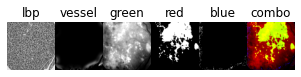

im0128_sick__UNDEF


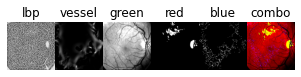

im0129_sick__UNDEF


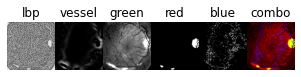

im0130_sick__UNDEF


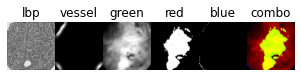

im0131_sick__UNDEF


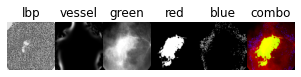

im0132_sick__UNDEF


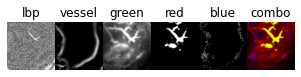

im0133_sick__BDR-NPDR


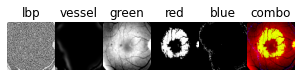

im0134_sick__BDR-NPDR


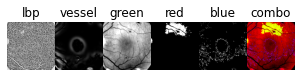

im0135_sick__BDR-NPDR


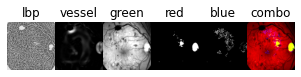

im0136_sick__BDR-NPDR


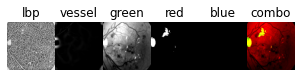

im0137_sick__BDR-NPDR


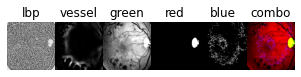

im0138_sick__BDR-NPDR


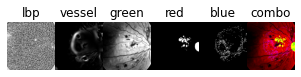

im0139_sick__BDR-NPDR


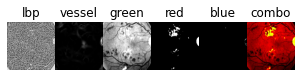

im0140_sick__BDR-NPDR


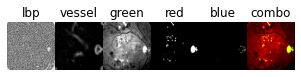

im0141_sick__BDR-NPDR


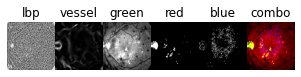

im0142_sick__CNV++UNDEF


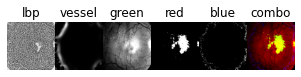

im0143_sick__CNV++UNDEF


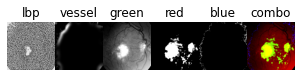

im0145_sick__CNV++UNDEF


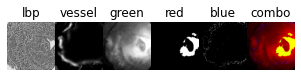

im0146_sick__UNDEF


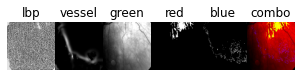

im0147_sick__CNV++UNDEF


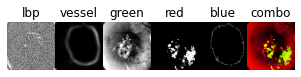

im0148_sick__CNV


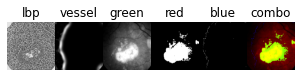

im0149_sick__CNV++UNDEF


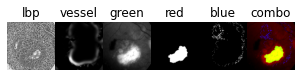

im0150_sick__CNV


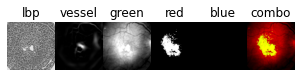

im0151_sick__CNV++UNDEF


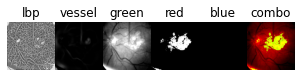

im0152_sick__UNDEF


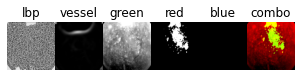

im0153_sick__UNDEF


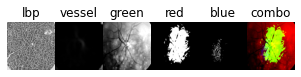

im0154_sick__CNV++UNDEF


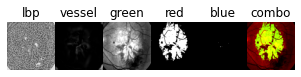

im0155_sick__BDR-NPDR++ASR


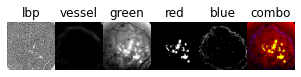

im0156_sick__BDR-NPDR++ASR


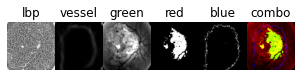

im0157_sick__BDR-NPDR


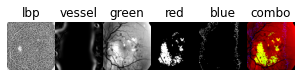

im0158_sick__CNV++BDR-NPDR


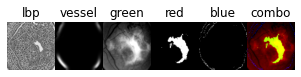

im0159_sick__UNDEF


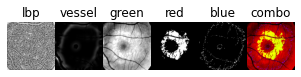

im0160_sick__CRVO++ASR


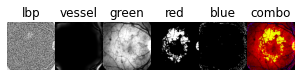

im0161_sick__CRVO


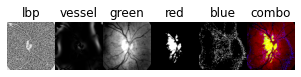

im0162_okay__Normal


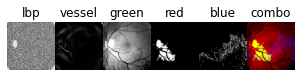

im0163_okay__Normal


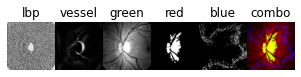

im0164_okay__Normal


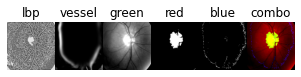

im0165_sick__CRVO


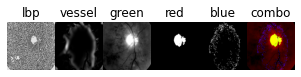

im0166_sick__CRVO


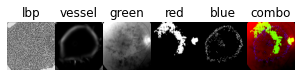

im0168_sick__CRVO++CRAO


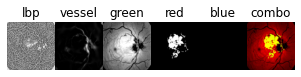

im0169_sick__CRVO++CRAO


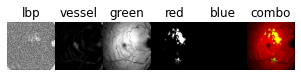

im0170_okay__Normal


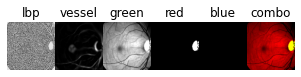

im0171_sick__CNV++UNDEF


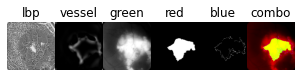

im0172_sick__CNV++UNDEF


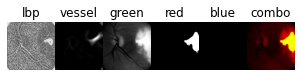

im0173_sick__UNDEF


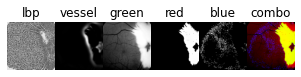

im0174_sick__UNDEF


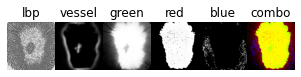

im0175_sick__UNDEF


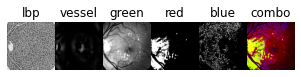

im0176_sick__UNDEF


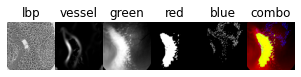

im0177_sick__Coats


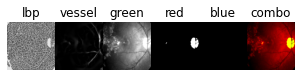

im0178_sick__Coats


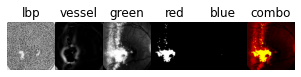

im0179_sick__PDR


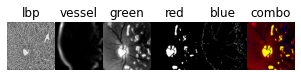

im0180_sick__UNDEF


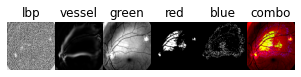

im0181_sick__UNDEF


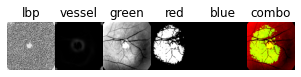

im0182_sick__UNDEF


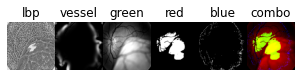

im0183_sick__UNDEF


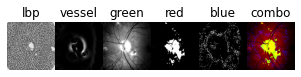

im0184_okay__Normal++UNDEF


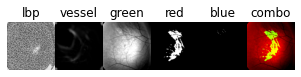

im0185_sick__UNDEF


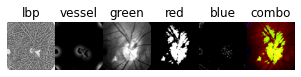

im0186_sick__BDR-NPDR


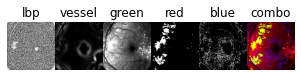

im0187_sick__BDR-NPDR


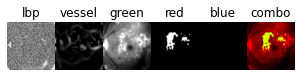

im0188_sick__BDR-NPDR


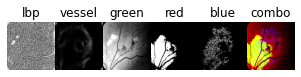

im0189_sick__BDR-NPDR


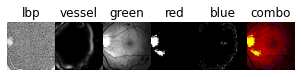

im0190_okay__Normal


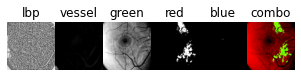

im0191_sick__BDR-NPDR


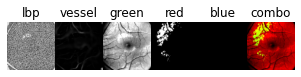

im0192_sick__PDR++UNDEF


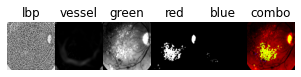

im0193_sick__BDR-NPDR++UNDEF


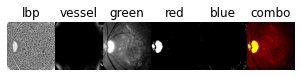

im0194_sick__BDR-NPDR


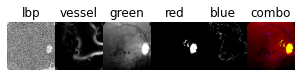

im0195_sick__BDR-NPDR


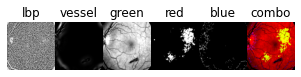

im0196_sick__BDR-NPDR++ASR


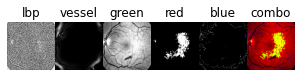

im0197_sick__BDR-NPDR


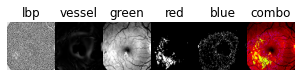

im0198_okay__Normal


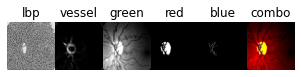

im0199_okay__Normal


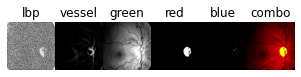

im0200_sick__BRVO


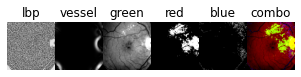

im0201_sick__BRVO


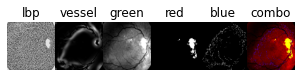

im0202_sick__BRVO


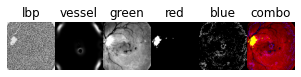

im0203_sick__PDR


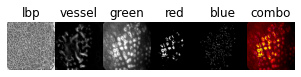

im0204_sick__PDR


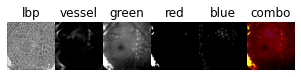

im0205_sick__BDR-NPDR


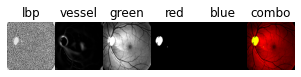

im0206_sick__CRVO


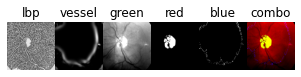

im0207_sick__CRVO


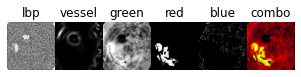

im0208_sick__ASR


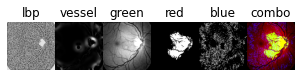

im0209_sick__BRVO++ASR


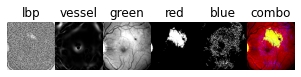

im0210_sick__CRVO


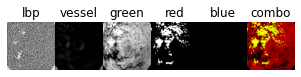

im0211_sick__CRVO


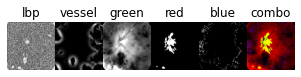

im0212_sick__UNDEF++HTR


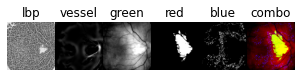

im0213_okay__Normal++UNDEF


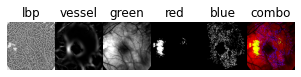

im0214_sick__Hemi-CRVO


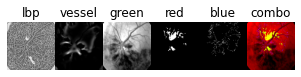

im0215_sick__Hemi-CRVO


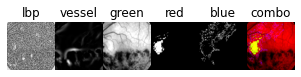

im0216_okay__Normal


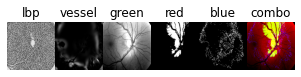

im0217_sick__CRVO


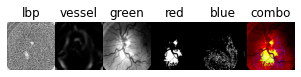

im0218_sick__CRVO


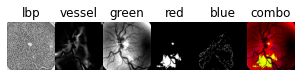

im0219_okay__Normal


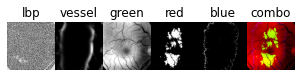

im0220_sick__HTR


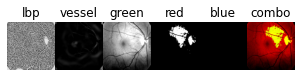

im0221_sick__UNDEF


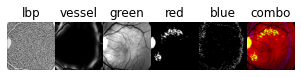

im0222_sick__BDR-NPDR


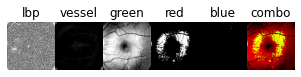

im0223_sick__BDR-NPDR


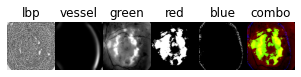

im0224_sick__BDR-NPDR


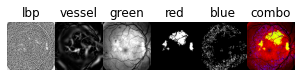

im0225_sick__BDR-NPDR


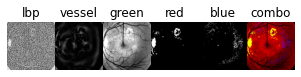

im0226_sick__Hemi-CRVO


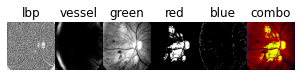

im0227_sick__BDR-NPDR


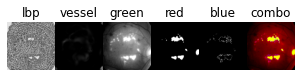

im0228_sick__BDR-NPDR


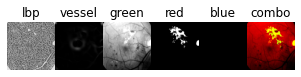

im0229_sick__BDR-NPDR++UNDEF


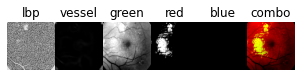

im0230_sick__BDR-NPDR++ASR


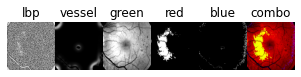

im0231_okay__Normal


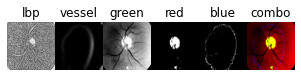

im0232_sick__PDR


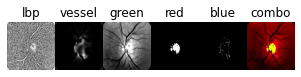

im0233_sick__BDR-NPDR


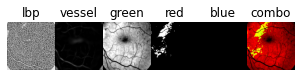

im0234_okay__Normal


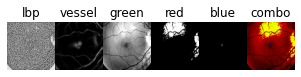

im0235_okay__Normal


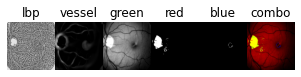

im0236_okay__Normal


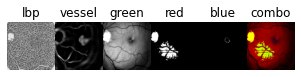

im0237_okay__Normal


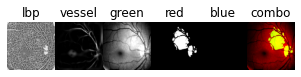

im0238_okay__Normal


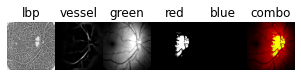

im0239_okay__Normal


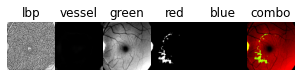

im0240_okay__Normal


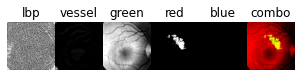

im0241_okay__Normal


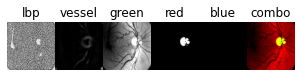

im0242_okay__Normal


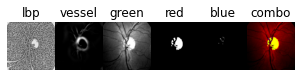

im0243_okay__Normal


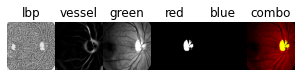

im0244_okay__Normal


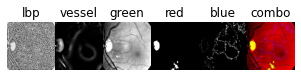

im0245_okay__Normal


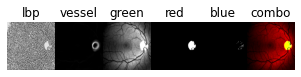

im0246_sick__CNV


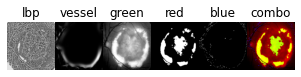

im0247_sick__BDR-NPDR


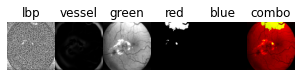

im0248_sick__CNV


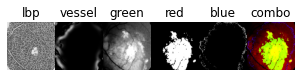

im0249_okay__Normal


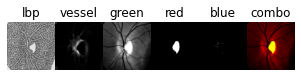

im0250_sick__UNDEF


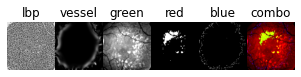

im0251_sick__BDR-NPDR


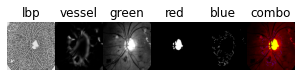

im0252_okay__Normal


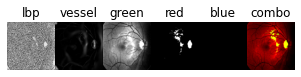

im0253_okay__Normal


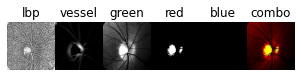

im0254_okay__Normal


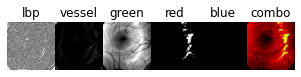

im0255_okay__Normal


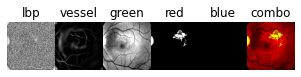

im0256_sick__BDR-NPDR++UNDEF


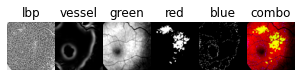

im0257_sick__CRVO


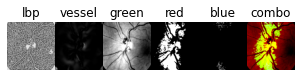

im0258_sick__CRVO


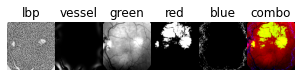

im0259_sick__CNV


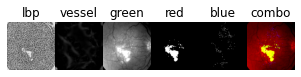

im0260_sick__CNV++UNDEF


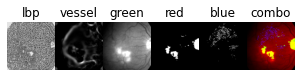

im0261_sick__CNV++UNDEF


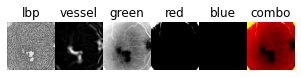

im0262_sick__UNDEF++ASR


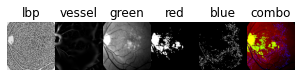

im0263_sick__UNDEF++ASR


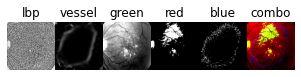

im0264_sick__UNDEF++HTR


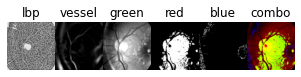

im0265_sick__UNDEF++HTR


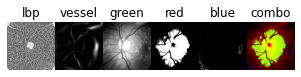

im0266_sick__UNDEF++HTR


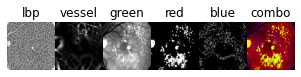

im0267_sick__CNV++HTR++UNDEF


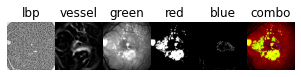

im0268_sick__CNV++UNDEF


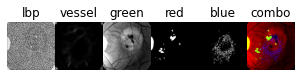

im0269_sick__CNV++UNDEF


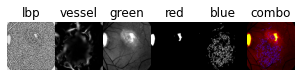

im0270_sick__CNV++UNDEF


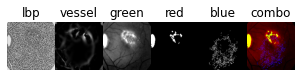

im0271_sick__HTR


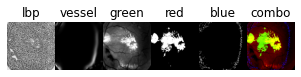

im0272_sick__HTR


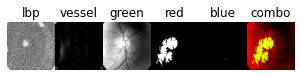

im0273_sick__UNDEF


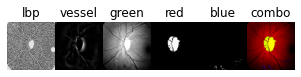

im0274_sick__HTR


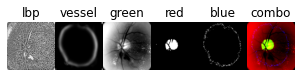

im0275_sick__HTR


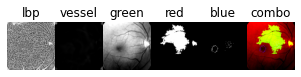

im0276_sick__HTR


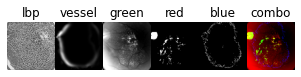

im0277_sick__BDR-NPDR


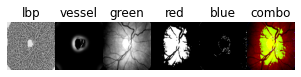

im0278_okay__Normal


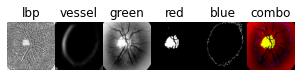

im0279_sick__MA


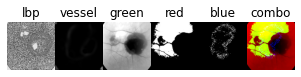

im0280_sick__ASR


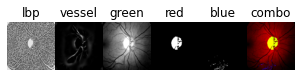

im0281_sick__HTR


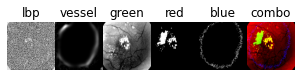

im0282_sick__UNDEF


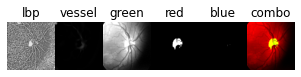

im0283_sick__UNDEF


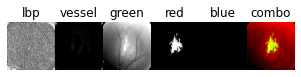

im0284_sick__ASR


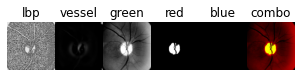

im0285_sick__UNDEF


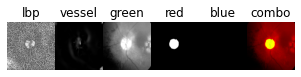

im0286_sick__UNDEF


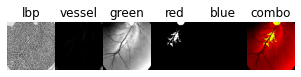

im0287_sick__UNDEF


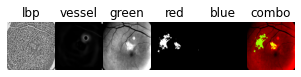

im0288_sick__UNDEF


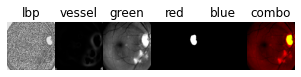

im0289_sick__UNDEF


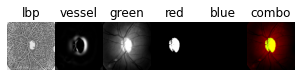

im0290_sick__UNDEF


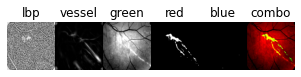

im0291_sick__UNDEF


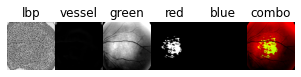

im0292_sick__UNDEF


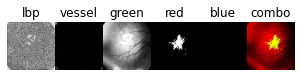

im0293_sick__ASR++HTR


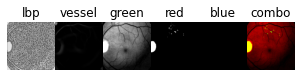

im0294_sick__UNDEF


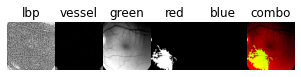

im0295_sick__UNDEF


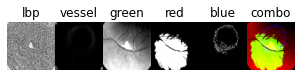

im0296_sick__UNDEF


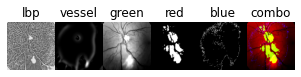

im0297_sick__BRAO


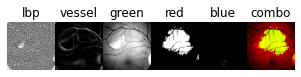

im0298_sick__UNDEF


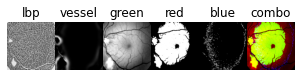

im0299_sick__BRAO


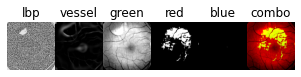

im0300_sick__UNDEF


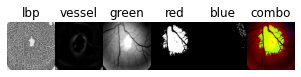

im0301_sick__UNDEF


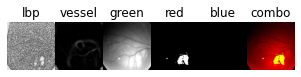

im0302_sick__UNDEF


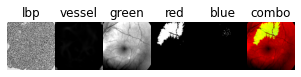

im0303_sick__UNDEF


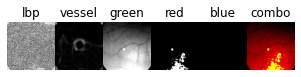

im0304_sick__UNDEF


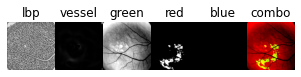

im0305_sick__UNDEF


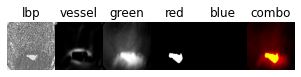

im0306_sick__Coats


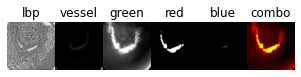

im0307_sick__UNDEF


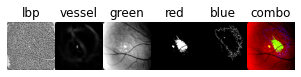

im0308_sick__Coats


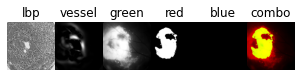

im0309_sick__Coats


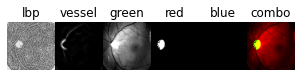

im0310_sick__CNV++UNDEF


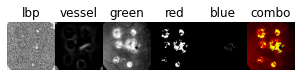

im0311_sick__Coats


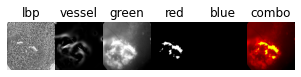

im0312_sick__Coats


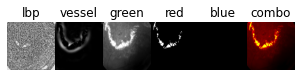

im0313_sick__Coats


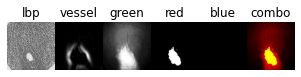

im0314_sick__Coats


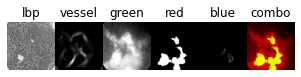

im0315_sick__Coats


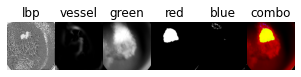

im0316_sick__Coats


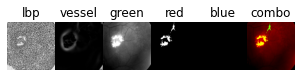

im0317_sick__Emboli


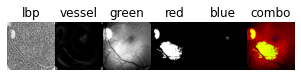

im0318_sick__CRAO++Emboli


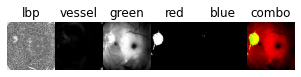

im0319_sick__Emboli


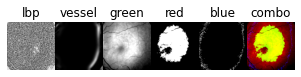

im0320_sick__CRAO


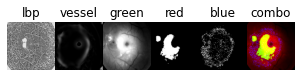

im0321_sick__CRAO++Emboli


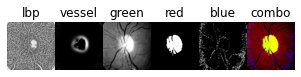

im0322_sick__CRAO++Emboli


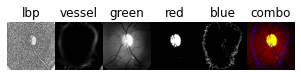

im0323_sick__Emboli


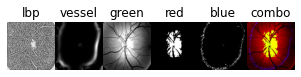

im0324_sick__Emboli


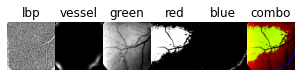

im0325_sick__Emboli


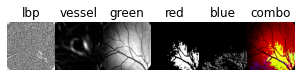

im0326_sick__BRAO++Emboli


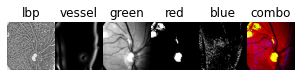

im0327_sick__BRAO++Emboli


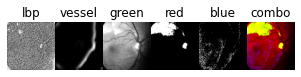

im0328_sick__BRAO++Emboli


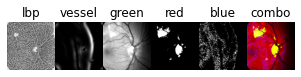

im0329_sick__Hemi-CRVO


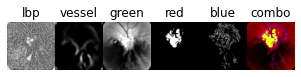

im0330_sick__BRVO


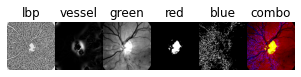

im0331_sick__CRVO


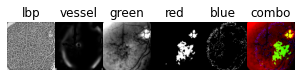

im0332_sick__Hemi-CRVO++HTR


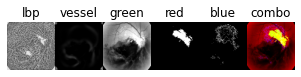

im0333_sick__Hemi-CRVO


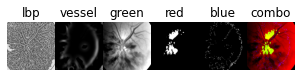

im0334_sick__Hemi-CRVO++ASR


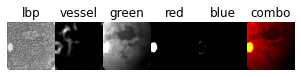

im0335_sick__Hemi-CRVO


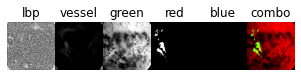

im0336_sick__Hemi-CRVO


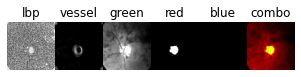

im0337_sick__CRVO


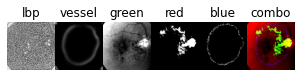

im0338_sick__BRVO


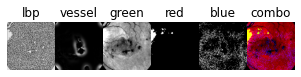

im0339_sick__UNDEF++HTR


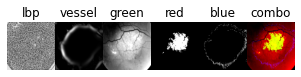

im0340_sick__PDR


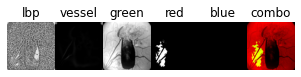

im0341_sick__PDR


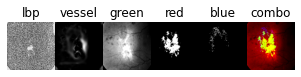

im0342_sick__PDR


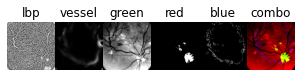

im0343_sick__PDR


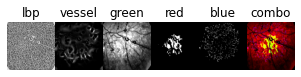

im0344_sick__UNDEF


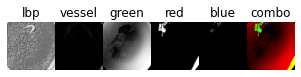

im0345_sick__PDR


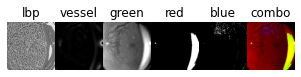

im0346_sick__PDR


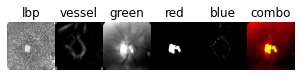

im0347_sick__PDR


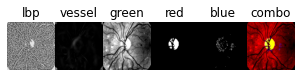

im0348_sick__PDR


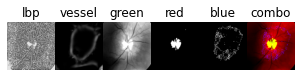

im0349_sick__PDR


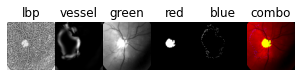

im0350_sick__PDR


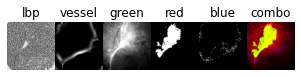

im0351_sick__PDR


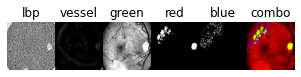

im0352_sick__PDR


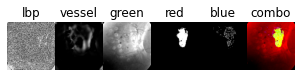

im0353_sick__PDR


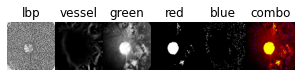

im0354_sick__PDR


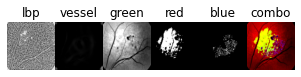

im0355_sick__UNDEF++HTR++ASR


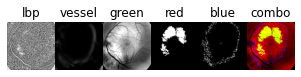

im0356_sick__PDR


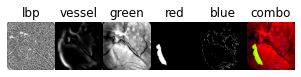

im0357_sick__MA


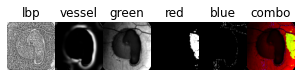

im0358_sick__MA


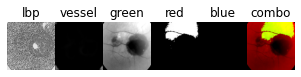

im0359_sick__MA


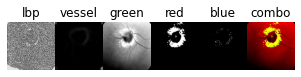

im0360_sick__UNDEF


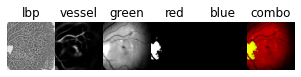

im0361_sick__MA++HTR


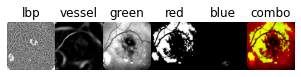

im0362_sick__MA


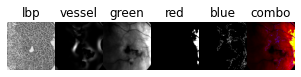

im0363_sick__MA


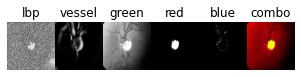

im0364_sick__BRVO++ASR


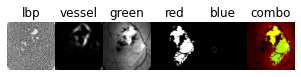

im0365_sick__BRVO


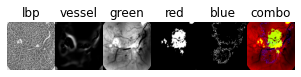

im0366_sick__BRVO++ASR


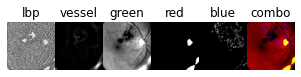

im0367_sick__BRVO


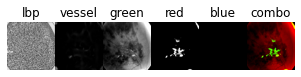

im0368_sick__Hemi-CRVO


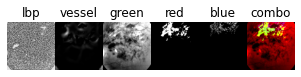

im0369_sick__Hemi-CRVO


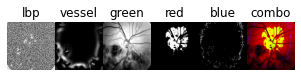

im0370_sick__CNV++UNDEF


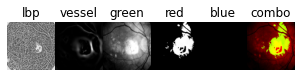

im0371_sick__CNV


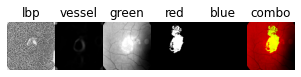

im0372_sick__CNV++UNDEF


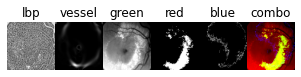

im0373_sick__CNV++UNDEF


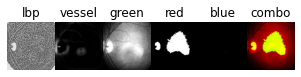

im0374_sick__UNDEF


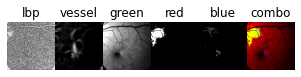

im0375_sick__CNV++UNDEF


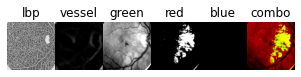

im0376_sick__CNV++UNDEF


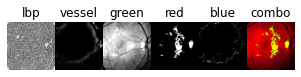

im0377_sick__CNV++UNDEF


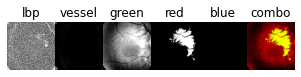

im0378_sick__CNV++HTR++UNDEF


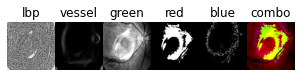

im0379_sick__CNV++UNDEF


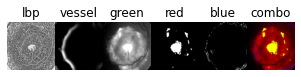

im0380_sick__CNV++UNDEF


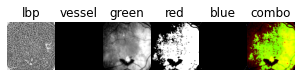

im0381_sick__CNV++ASR++UNDEF


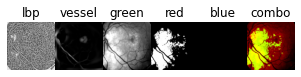

im0382_sick__CNV++UNDEF


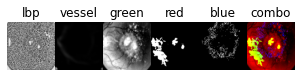

im0383_sick__CNV++UNDEF


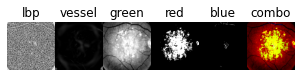

im0384_sick__CNV++UNDEF


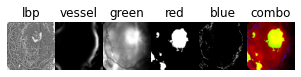

im0385_sick__CNV++UNDEF


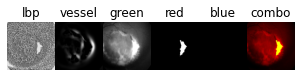

im0386_sick__UNDEF


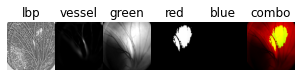

im0387_sick__UNDEF


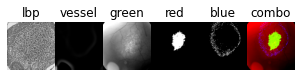

im0388_sick__UNDEF


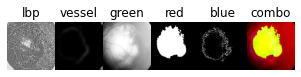

im0389_sick__UNDEF


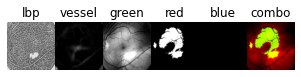

im0390_sick__UNDEF


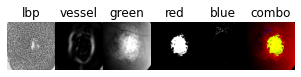

im0391_sick__UNDEF


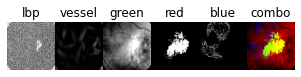

im0392_sick__UNDEF


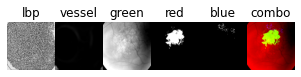

im0393_sick__UNDEF


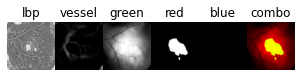

im0394_sick__UNDEF


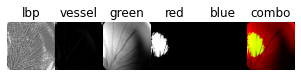

im0395_sick__UNDEF


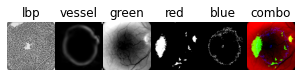

im0396_sick__HTR++ASR


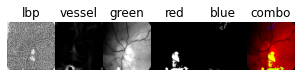

im0397_sick__HTR


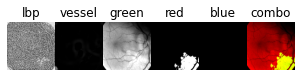

im0398_sick__HTR++ASR


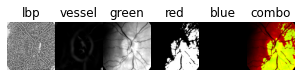

im0399_sick__BRAO++Emboli++ASR


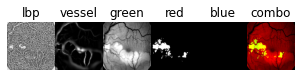

im0400_sick__BRAO++Emboli++ASR


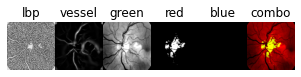

im0401_sick__UNDEF


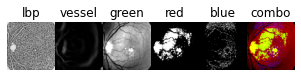

im0402_sick__UNDEF


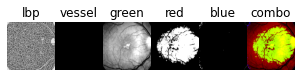

im0001_sick__BDR-NPDR


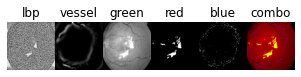

im0002_sick__CNV++ASR


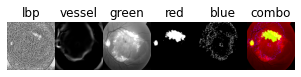

im0003_sick__UNDEF


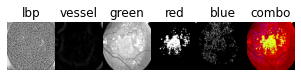

im0004_sick__UNDEF++CRAO


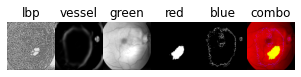

im0005_sick__CRAO++CRVO


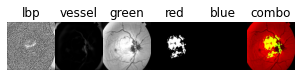

im0006_sick__UNDEF


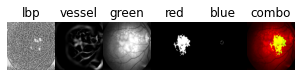

im0007_sick__CNV++UNDEF++ASR++HTR


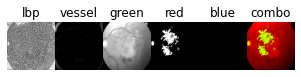

im0008_sick__CNV++UNDEF++ASR


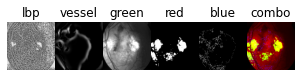

im0009_sick__BDR-NPDR


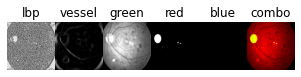

im0010_sick__UNDEF


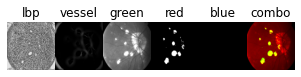

im0011_sick__CNV++UNDEF


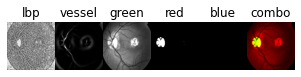

im0012_sick__UNDEF


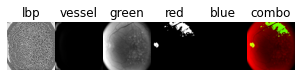

im0013_sick__BDR-NPDR


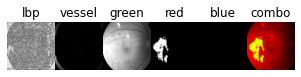

im0014_sick__UNDEF


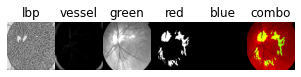

im0015_sick__UNDEF


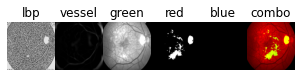

im0016_sick__BDR-NPDR


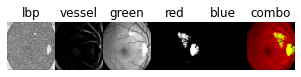

im0017_sick__CNV


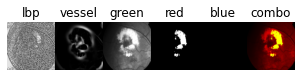

im0018_sick__CRVO


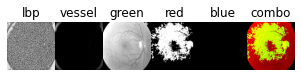

im0019_sick__CRVO


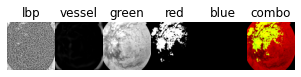

im0020_sick__CRAO++CRVO


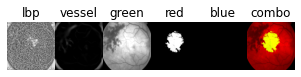

im0021_sick__PDR


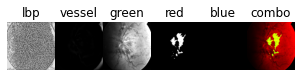

im0022_sick__ASR


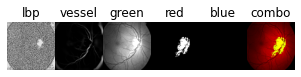

im0023_sick__UNDEF


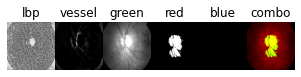

im0024_sick__UNDEF


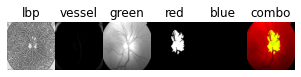

im0025_sick__CRVO++ASR


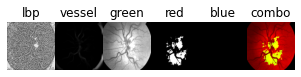

im0026_sick__CRVO


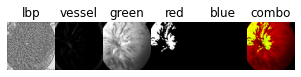

im0027_sick__CRVO


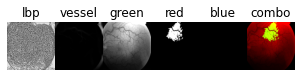

im0028_sick__Hemi-CRVO++ASR


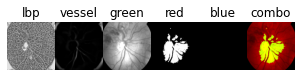

im0029_sick__UNDEF


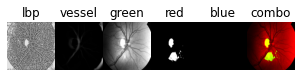

im0030_okay__Normal


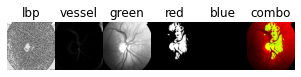

im0031_sick__BDR-NPDR


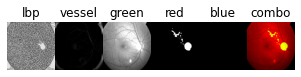

im0032_okay__Normal


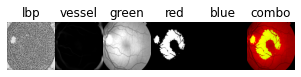

im0033_sick__CRVO


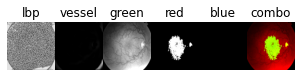

im0034_sick__CNV++UNDEF


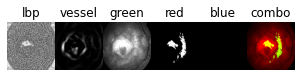

im0035_sick__UNDEF


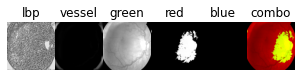

im0036_sick__CNV++UNDEF


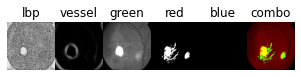

im0037_sick__CNV++UNDEF++HTR


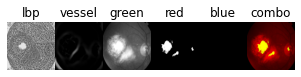

im0038_sick__BDR-NPDR++HTR


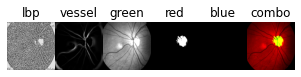

im0039_sick__UNDEF


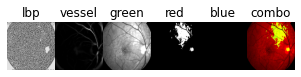

im0040_sick__BDR-NPDR


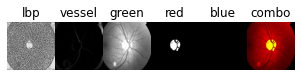

im0041_sick__UNDEF


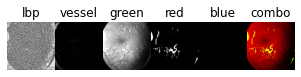

im0042_sick__UNDEF


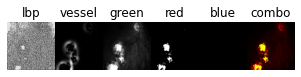

im0043_sick__UNDEF


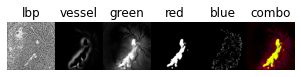

im0044_sick__UNDEF


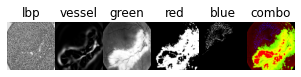

im0045_sick__CNV++UNDEF++ASR


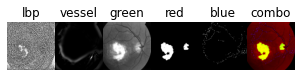

im0046_sick__UNDEF


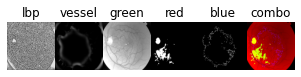

im0048_sick__HTR


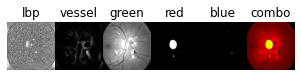

im0049_sick__Coats


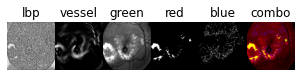

im0050_sick__BDR-NPDR


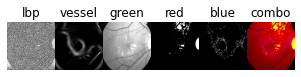

im0051_sick__BDR-NPDR


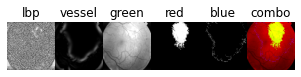

im0052_sick__Coats


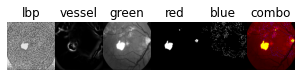

im0053_sick__CNV++UNDEF


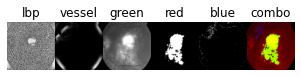

im0054_sick__CNV++UNDEF


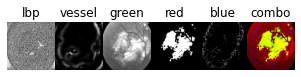

im0055_sick__UNDEF


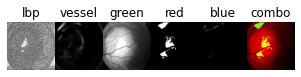

im0056_sick__UNDEF


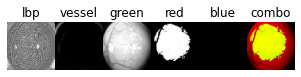

im0057_sick__HTR++BDR-NPDR


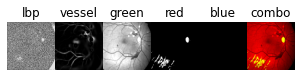

im0058_sick__BDR-NPDR


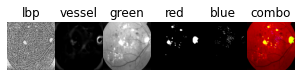

im0059_sick__BDR-NPDR++UNDEF


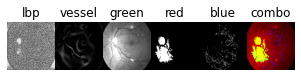

im0060_sick__BDR-NPDR


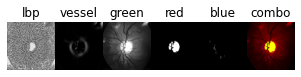

im0061_sick__CNV++UNDEF++HTR


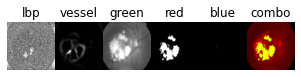

im0062_sick__CNV++UNDEF++ASR


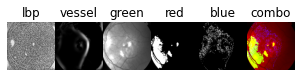

im0063_sick__UNDEF


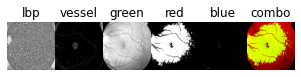

im0064_sick__MA++HTR++ASR


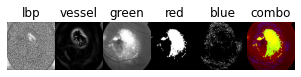

im0065_sick__HTR++BDR-NPDR


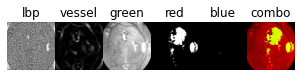

im0066_sick__UNDEF


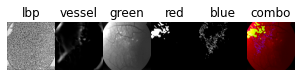

im0067_sick__UNDEF


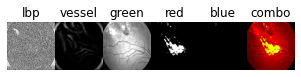

im0068_sick__UNDEF


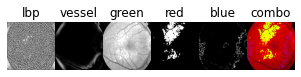

im0069_sick__BDR-NPDR


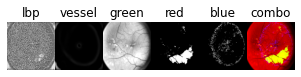

im0070_sick__BDR-NPDR


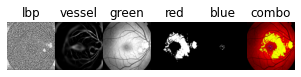

im0071_sick__UNDEF


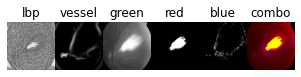

im0072_sick__UNDEF


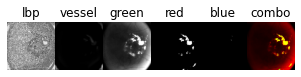

im0073_sick__HTR++ASR


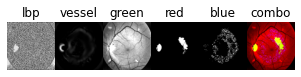

im0074_sick__CRVO


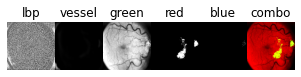

im0075_sick__HTR


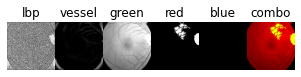

im0076_okay__Normal


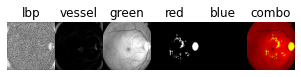

im0077_okay__Normal++HTR


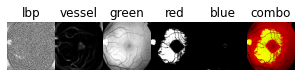

im0078_sick__UNDEF


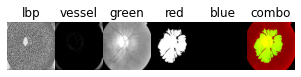

im0079_sick__UNDEF


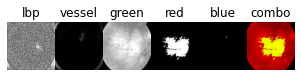

im0080_okay__Normal


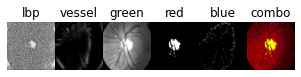

im0081_okay__Normal


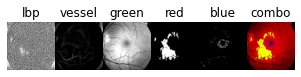

im0082_okay__Normal


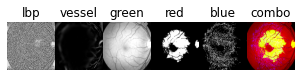

im0083_sick__CNV++UNDEF


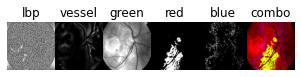

im0084_sick__CNV++UNDEF


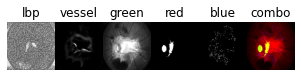

im0085_sick__PDR


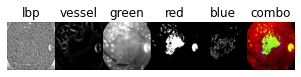

im0086_sick__UNDEF


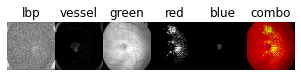

im0087_sick__PDR


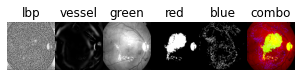

im0088_sick__UNDEF


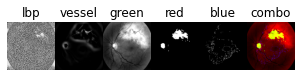

im0089_sick__BDR-NPDR++HTR


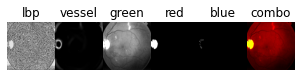

im0090_sick__HTR


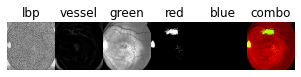

im0091_sick__CNV++UNDEF++UNDEF


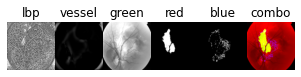

im0092_sick__CNV++UNDEF


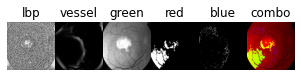

im0093_sick__Coats


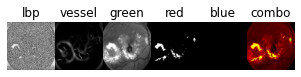

im0094_sick__BDR-NPDR++HTR


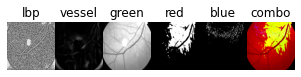

im0095_sick__BRVO


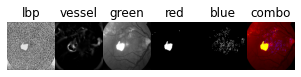

im0096_sick__BDR-NPDR


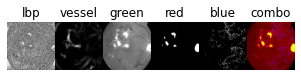

im0097_sick__UNDEF


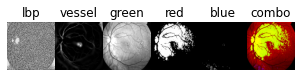

im0098_sick__UNDEF++HTR


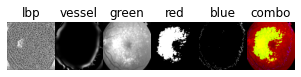

im0099_sick__UNDEF


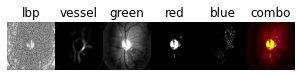

im0100_sick__CNV++UNDEF


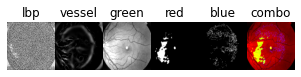

im0101_sick__CNV


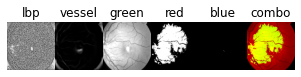

im0102_sick__UNDEF


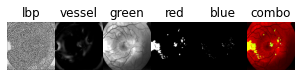

im0103_sick__CNV


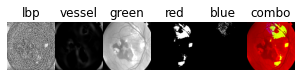

im0104_sick__CNV++UNDEF


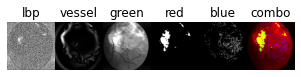

im0105_sick__CNV++UNDEF


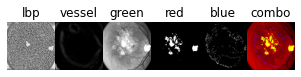

im0106_sick__CNV++UNDEF


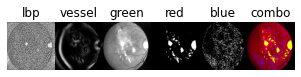

im0107_sick__UNDEF


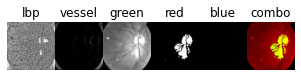

im0110_sick__CNV++UNDEF


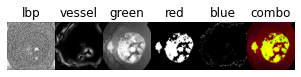

im0111_sick__BDR-NPDR++UNDEF


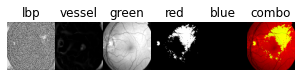

im0112_sick__UNDEF


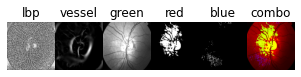

im0113_sick__BDR-NPDR


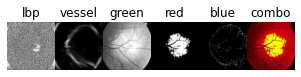

im0114_sick__BDR-NPDR


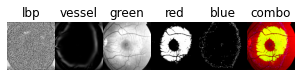

im0115_sick__BDR-NPDR


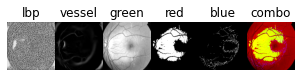

im0116_sick__BDR-NPDR


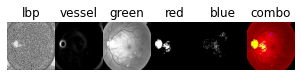

im0117_sick__BDR-NPDR++ASR


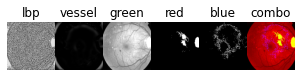

im0118_sick__BDR-NPDR++ASR


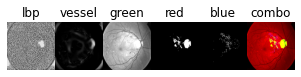

im0119_okay__Normal


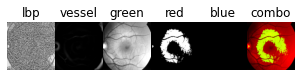

im0120_okay__Normal


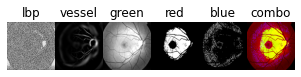

im0121_sick__BDR-NPDR


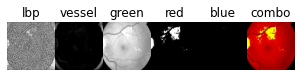

im0122_sick__BDR-NPDR


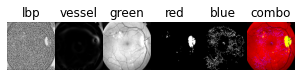

im0123_sick__BDR-NPDR


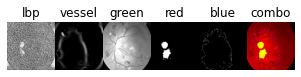

im0124_sick__BDR-NPDR


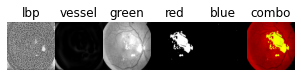

im0125_sick__BDR-NPDR


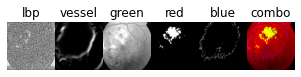

im0126_sick__BDR-NPDR


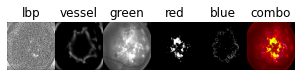

im0127_sick__BDR-NPDR


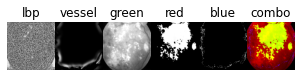

im0128_sick__UNDEF


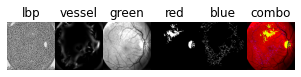

im0129_sick__UNDEF


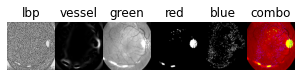

im0130_sick__UNDEF


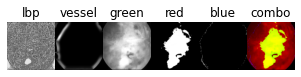

im0131_sick__UNDEF


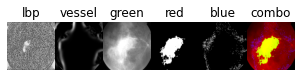

im0132_sick__UNDEF


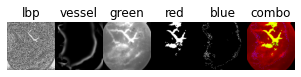

im0133_sick__BDR-NPDR


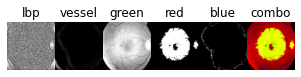

im0134_sick__BDR-NPDR


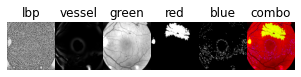

im0135_sick__BDR-NPDR


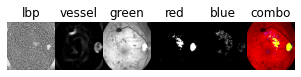

im0136_sick__BDR-NPDR


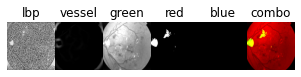

im0137_sick__BDR-NPDR


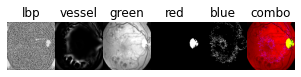

im0138_sick__BDR-NPDR


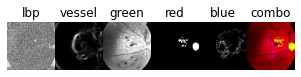

im0139_sick__BDR-NPDR


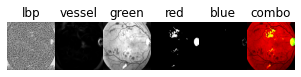

im0140_sick__BDR-NPDR


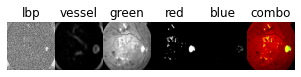

im0141_sick__BDR-NPDR


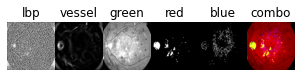

im0142_sick__CNV++UNDEF


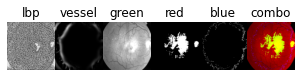

im0143_sick__CNV++UNDEF


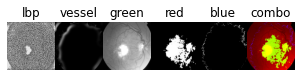

im0145_sick__CNV++UNDEF


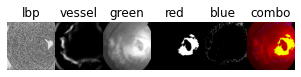

im0146_sick__UNDEF


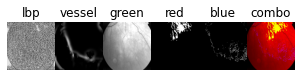

im0147_sick__CNV++UNDEF


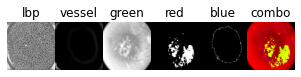

im0148_sick__CNV


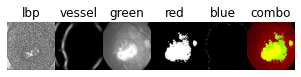

im0149_sick__CNV++UNDEF


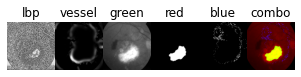

im0150_sick__CNV


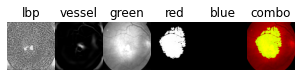

im0151_sick__CNV++UNDEF


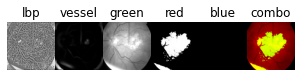

im0152_sick__UNDEF


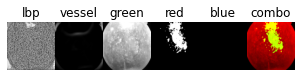

im0153_sick__UNDEF


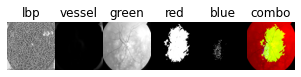

im0154_sick__CNV++UNDEF


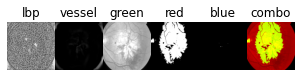

im0155_sick__BDR-NPDR++ASR


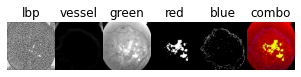

im0156_sick__BDR-NPDR++ASR


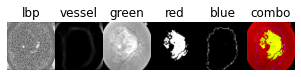

im0157_sick__BDR-NPDR


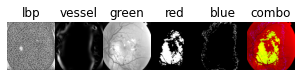

im0158_sick__CNV++BDR-NPDR


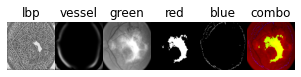

im0159_sick__UNDEF


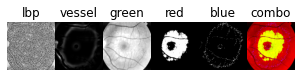

im0160_sick__CRVO++ASR


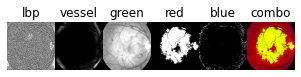

im0161_sick__CRVO


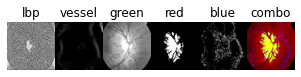

im0162_okay__Normal


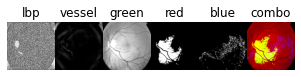

im0163_okay__Normal


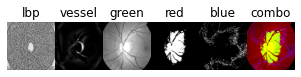

im0164_okay__Normal


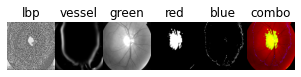

im0165_sick__CRVO


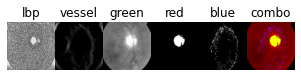

im0166_sick__CRVO


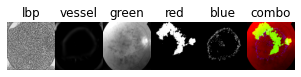

im0168_sick__CRVO++CRAO


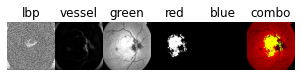

im0169_sick__CRVO++CRAO


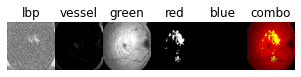

im0170_okay__Normal


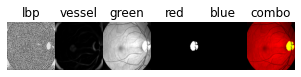

im0171_sick__CNV++UNDEF


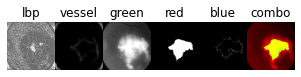

im0172_sick__CNV++UNDEF


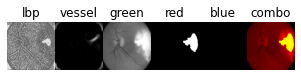

im0173_sick__UNDEF


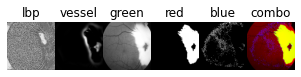

im0174_sick__UNDEF


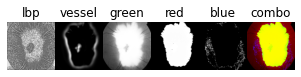

im0175_sick__UNDEF


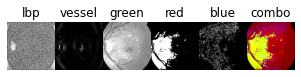

im0176_sick__UNDEF


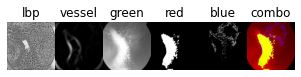

im0177_sick__Coats


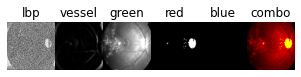

im0178_sick__Coats


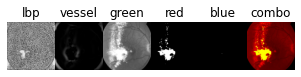

im0179_sick__PDR


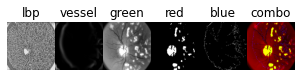

im0180_sick__UNDEF


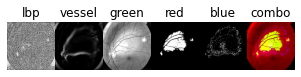

im0181_sick__UNDEF


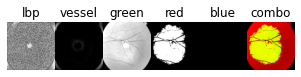

im0182_sick__UNDEF


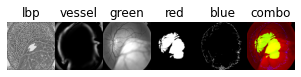

im0183_sick__UNDEF


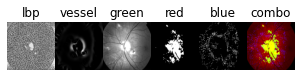

im0184_okay__Normal++UNDEF


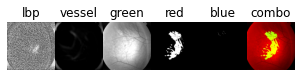

im0185_sick__UNDEF


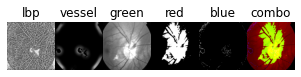

im0186_sick__BDR-NPDR


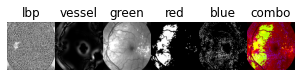

im0187_sick__BDR-NPDR


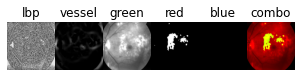

im0188_sick__BDR-NPDR


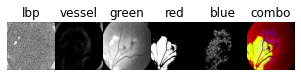

im0189_sick__BDR-NPDR


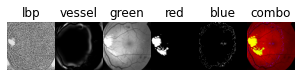

im0190_okay__Normal


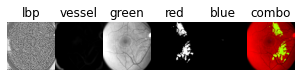

im0191_sick__BDR-NPDR


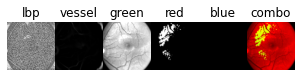

im0192_sick__PDR++UNDEF


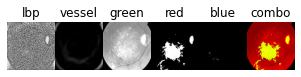

im0193_sick__BDR-NPDR++UNDEF


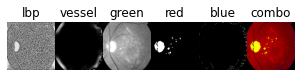

im0194_sick__BDR-NPDR


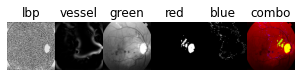

im0195_sick__BDR-NPDR


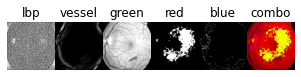

im0196_sick__BDR-NPDR++ASR


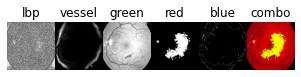

im0197_sick__BDR-NPDR


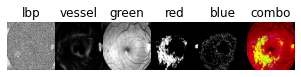

im0198_okay__Normal


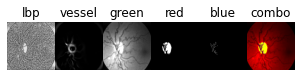

im0199_okay__Normal


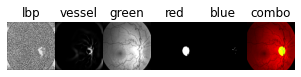

im0200_sick__BRVO


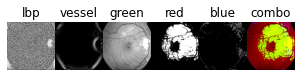

im0201_sick__BRVO


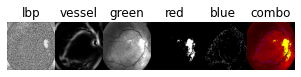

im0202_sick__BRVO


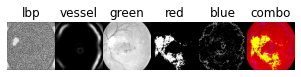

im0203_sick__PDR


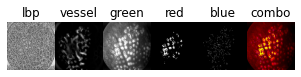

im0204_sick__PDR


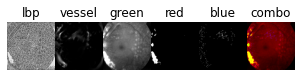

im0205_sick__BDR-NPDR


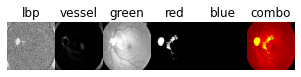

im0206_sick__CRVO


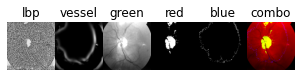

im0207_sick__CRVO


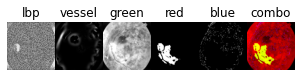

im0208_sick__ASR


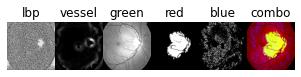

im0209_sick__BRVO++ASR


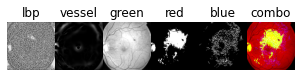

im0210_sick__CRVO


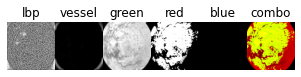

im0211_sick__CRVO


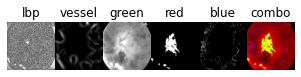

im0212_sick__UNDEF++HTR


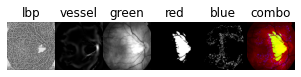

im0213_okay__Normal++UNDEF


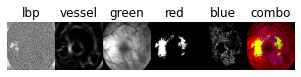

im0214_sick__Hemi-CRVO


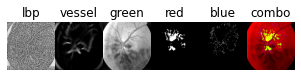

im0215_sick__Hemi-CRVO


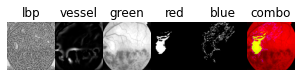

im0216_okay__Normal


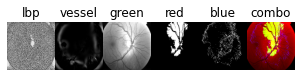

im0217_sick__CRVO


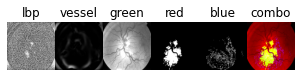

im0218_sick__CRVO


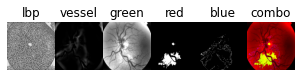

im0219_okay__Normal


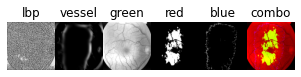

im0220_sick__HTR


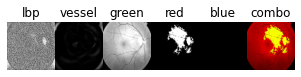

im0221_sick__UNDEF


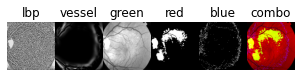

im0222_sick__BDR-NPDR


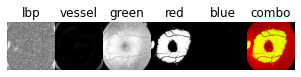

im0223_sick__BDR-NPDR


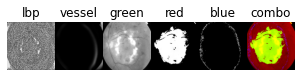

im0224_sick__BDR-NPDR


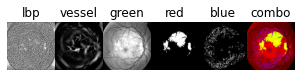

im0225_sick__BDR-NPDR


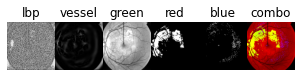

im0226_sick__Hemi-CRVO


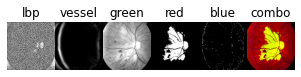

im0227_sick__BDR-NPDR


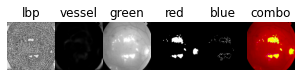

im0228_sick__BDR-NPDR


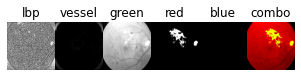

im0229_sick__BDR-NPDR++UNDEF


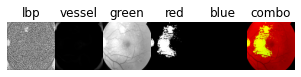

im0230_sick__BDR-NPDR++ASR


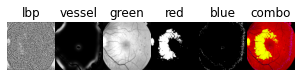

im0231_okay__Normal


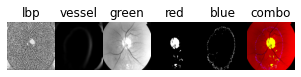

im0232_sick__PDR


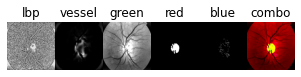

im0233_sick__BDR-NPDR


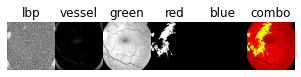

im0234_okay__Normal


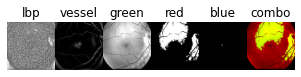

im0235_okay__Normal


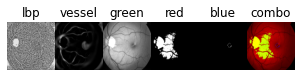

im0236_okay__Normal


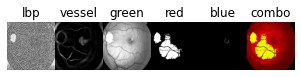

im0237_okay__Normal


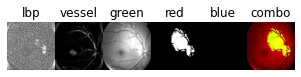

im0238_okay__Normal


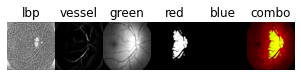

im0239_okay__Normal


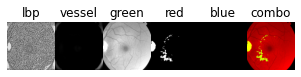

im0240_okay__Normal


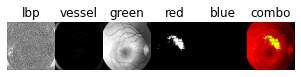

im0241_okay__Normal


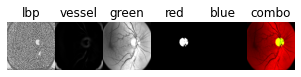

im0242_okay__Normal


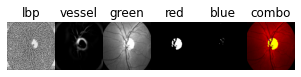

im0243_okay__Normal


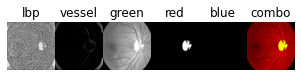

im0244_okay__Normal


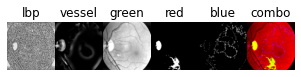

im0245_okay__Normal


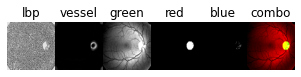

im0246_sick__CNV


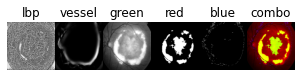

im0247_sick__BDR-NPDR


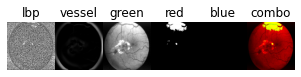

im0248_sick__CNV


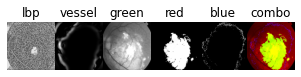

im0249_okay__Normal


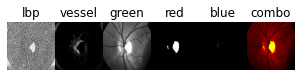

im0250_sick__UNDEF


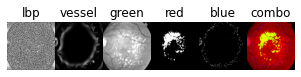

im0251_sick__BDR-NPDR


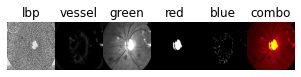

im0252_okay__Normal


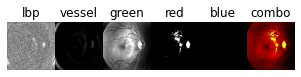

im0253_okay__Normal


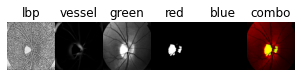

im0254_okay__Normal


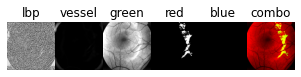

im0255_okay__Normal


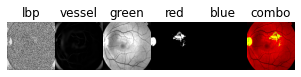

im0256_sick__BDR-NPDR++UNDEF


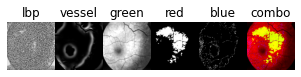

im0257_sick__CRVO


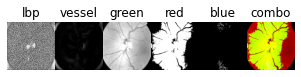

im0258_sick__CRVO


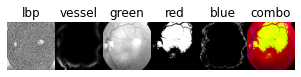

im0259_sick__CNV


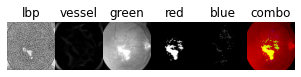

im0260_sick__CNV++UNDEF


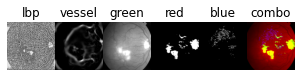

im0261_sick__CNV++UNDEF


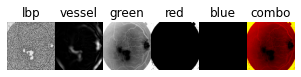

im0262_sick__UNDEF++ASR


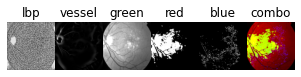

im0263_sick__UNDEF++ASR


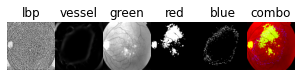

im0264_sick__UNDEF++HTR


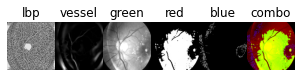

im0265_sick__UNDEF++HTR


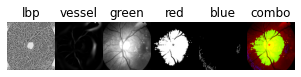

im0266_sick__UNDEF++HTR


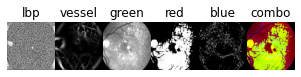

im0267_sick__CNV++HTR++UNDEF


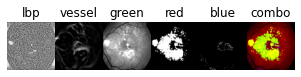

im0268_sick__CNV++UNDEF


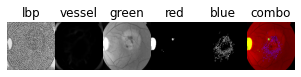

im0269_sick__CNV++UNDEF


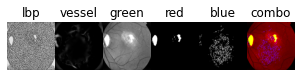

im0270_sick__CNV++UNDEF


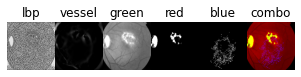

im0271_sick__HTR


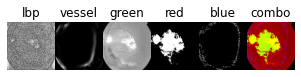

im0272_sick__HTR


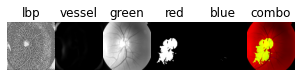

im0273_sick__UNDEF


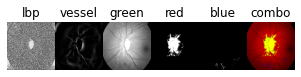

im0274_sick__HTR


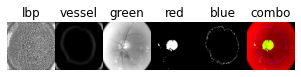

im0275_sick__HTR


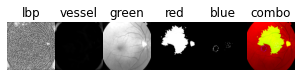

im0276_sick__HTR


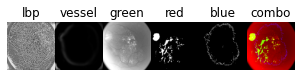

im0277_sick__BDR-NPDR


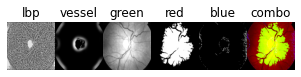

im0278_okay__Normal


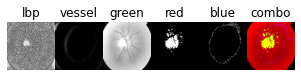

im0279_sick__MA


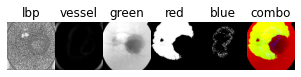

im0280_sick__ASR


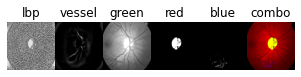

im0281_sick__HTR


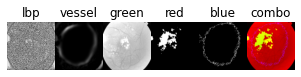

im0282_sick__UNDEF


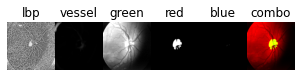

im0283_sick__UNDEF


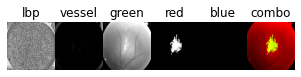

im0284_sick__ASR


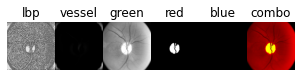

im0285_sick__UNDEF


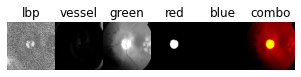

im0286_sick__UNDEF


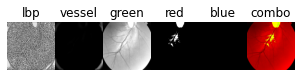

im0287_sick__UNDEF


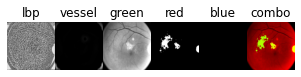

im0288_sick__UNDEF


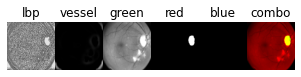

im0289_sick__UNDEF


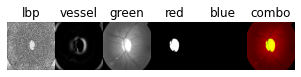

im0290_sick__UNDEF


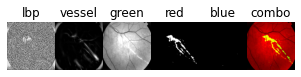

im0291_sick__UNDEF


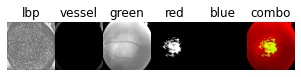

im0292_sick__UNDEF


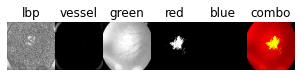

im0293_sick__ASR++HTR


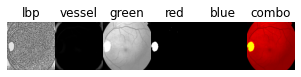

im0294_sick__UNDEF


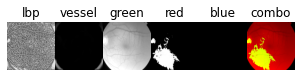

im0295_sick__UNDEF


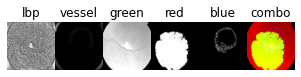

im0296_sick__UNDEF


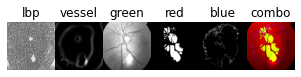

im0297_sick__BRAO


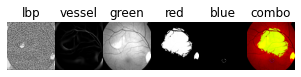

im0298_sick__UNDEF


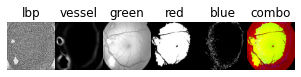

im0299_sick__BRAO


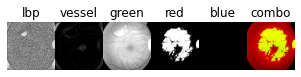

im0300_sick__UNDEF


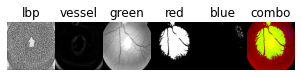

im0301_sick__UNDEF


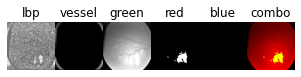

im0302_sick__UNDEF


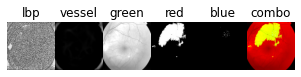

im0303_sick__UNDEF


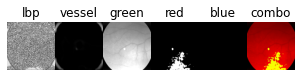

im0304_sick__UNDEF


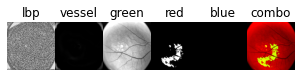

im0305_sick__UNDEF


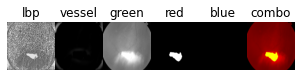

im0306_sick__Coats


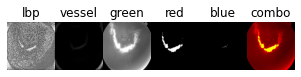

im0307_sick__UNDEF


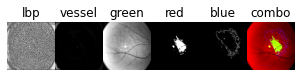

im0308_sick__Coats


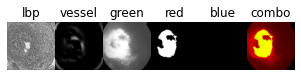

im0309_sick__Coats


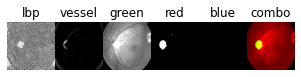

im0310_sick__CNV++UNDEF


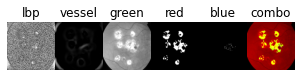

im0311_sick__Coats


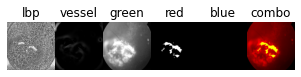

im0312_sick__Coats


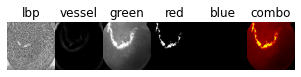

im0313_sick__Coats


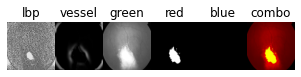

im0314_sick__Coats


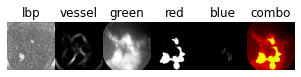

im0315_sick__Coats


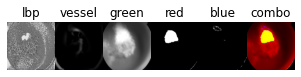

im0316_sick__Coats


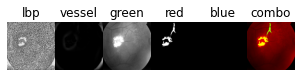

im0317_sick__Emboli


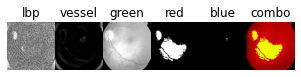

im0318_sick__CRAO++Emboli


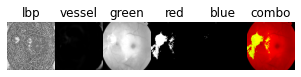

im0319_sick__Emboli


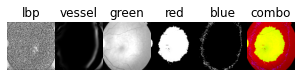

im0320_sick__CRAO


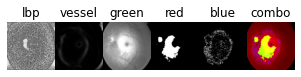

im0321_sick__CRAO++Emboli


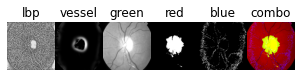

im0322_sick__CRAO++Emboli


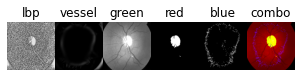

im0323_sick__Emboli


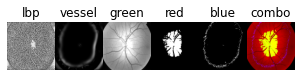

im0324_sick__Emboli


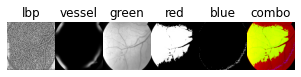

im0325_sick__Emboli


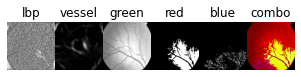

im0326_sick__BRAO++Emboli


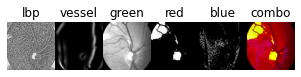

im0327_sick__BRAO++Emboli


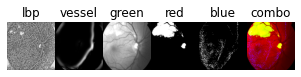

im0328_sick__BRAO++Emboli


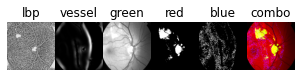

im0329_sick__Hemi-CRVO


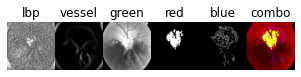

im0330_sick__BRVO


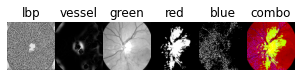

im0331_sick__CRVO


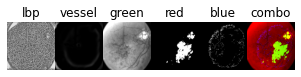

im0332_sick__Hemi-CRVO++HTR


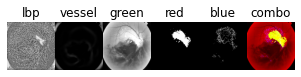

im0333_sick__Hemi-CRVO


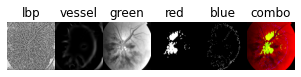

im0334_sick__Hemi-CRVO++ASR


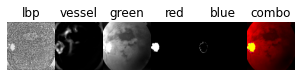

im0335_sick__Hemi-CRVO


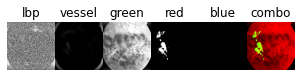

im0336_sick__Hemi-CRVO


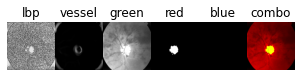

im0337_sick__CRVO


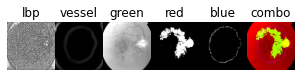

im0338_sick__BRVO


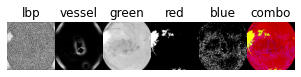

im0339_sick__UNDEF++HTR


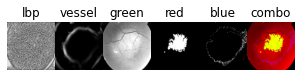

im0340_sick__PDR


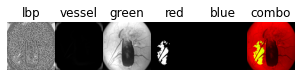

im0341_sick__PDR


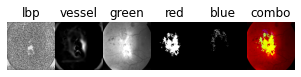

im0342_sick__PDR


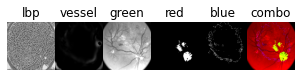

im0343_sick__PDR


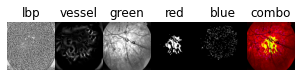

im0344_sick__UNDEF


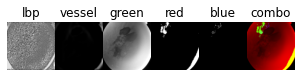

im0345_sick__PDR


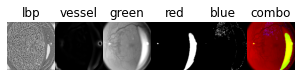

im0346_sick__PDR


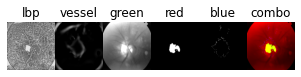

im0347_sick__PDR


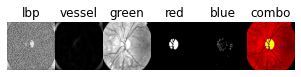

im0348_sick__PDR


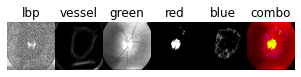

im0349_sick__PDR


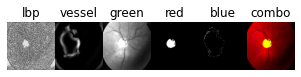

im0350_sick__PDR


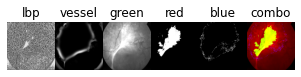

im0351_sick__PDR


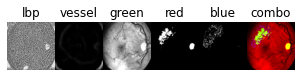

im0352_sick__PDR


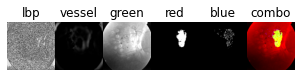

im0353_sick__PDR


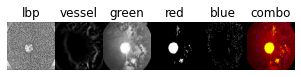

im0354_sick__PDR


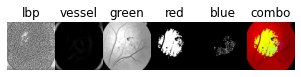

im0355_sick__UNDEF++HTR++ASR


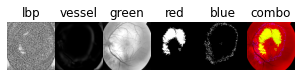

im0356_sick__PDR


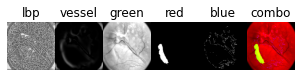

im0357_sick__MA


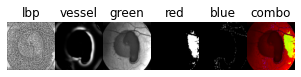

im0358_sick__MA


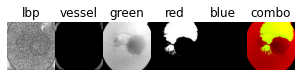

im0359_sick__MA


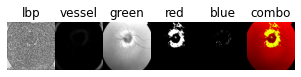

im0360_sick__UNDEF


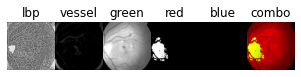

im0361_sick__MA++HTR


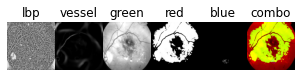

im0362_sick__MA


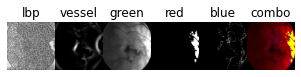

im0363_sick__MA


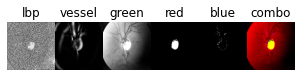

im0364_sick__BRVO++ASR


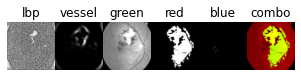

im0365_sick__BRVO


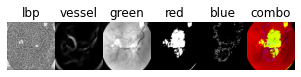

im0366_sick__BRVO++ASR


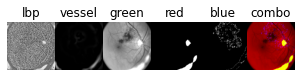

im0367_sick__BRVO


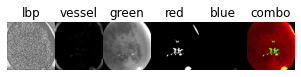

im0368_sick__Hemi-CRVO


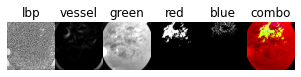

im0369_sick__Hemi-CRVO


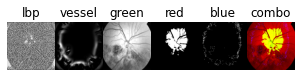

im0370_sick__CNV++UNDEF


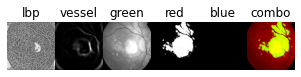

im0371_sick__CNV


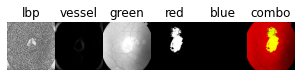

im0372_sick__CNV++UNDEF


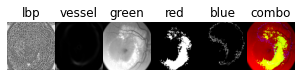

im0373_sick__CNV++UNDEF


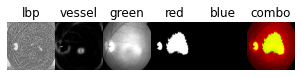

im0374_sick__UNDEF


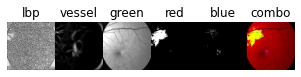

im0375_sick__CNV++UNDEF


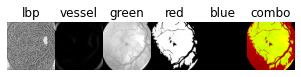

im0376_sick__CNV++UNDEF


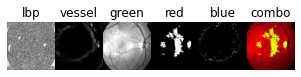

im0377_sick__CNV++UNDEF


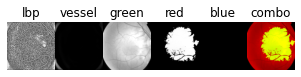

im0378_sick__CNV++HTR++UNDEF


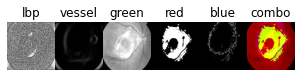

im0379_sick__CNV++UNDEF


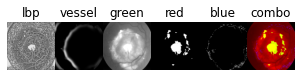

im0380_sick__CNV++UNDEF


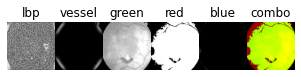

im0381_sick__CNV++ASR++UNDEF


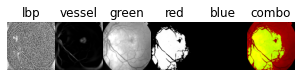

im0382_sick__CNV++UNDEF


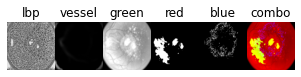

im0383_sick__CNV++UNDEF


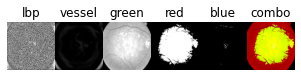

im0384_sick__CNV++UNDEF


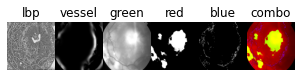

im0385_sick__CNV++UNDEF


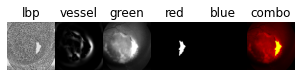

im0386_sick__UNDEF


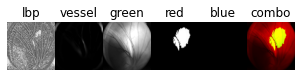

im0387_sick__UNDEF


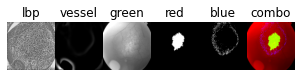

im0388_sick__UNDEF


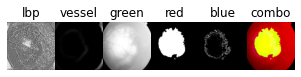

im0389_sick__UNDEF


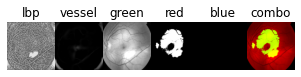

im0390_sick__UNDEF


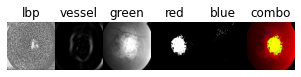

im0391_sick__UNDEF


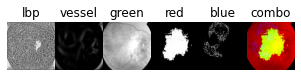

im0392_sick__UNDEF


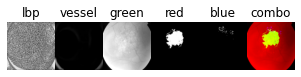

im0393_sick__UNDEF


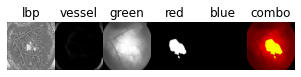

im0394_sick__UNDEF


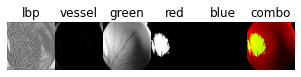

im0395_sick__UNDEF


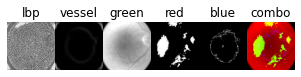

im0396_sick__HTR++ASR


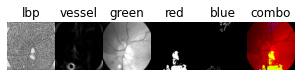

im0397_sick__HTR


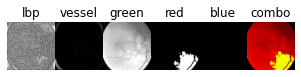

im0398_sick__HTR++ASR


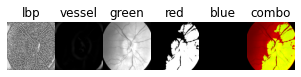

im0399_sick__BRAO++Emboli++ASR


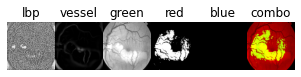

im0400_sick__BRAO++Emboli++ASR


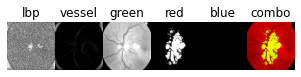

im0401_sick__UNDEF


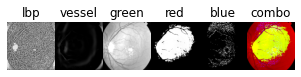

im0402_sick__UNDEF


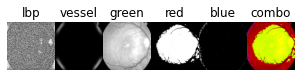

In [7]:
fda_opts = [(loader_p75+funduzor_1+lbp_adder,  "./output/fda_out75"),
             (loader_p85+funduzor_1+lbp_adder, "./output/fda_out85") ]

for pipez, fdir in fda_opts:
    fda_run(pipez, fdir, trainin_X=X_data) 


# 5. Permutationz

In [8]:
from sklearn.linear_model import LogisticRegression
from sklearn import svm 

import model

In [10]:
dpipez = [
    Pipeline(loader_p75+funduzor_1+channelz_g_only), # green only 
    Pipeline(loader_p75+funduzor_1+channelz_grb), # green red blue 
    Pipeline(loader_p75+funduzor_1),  # vessel, green red blue 
    Pipeline(loader_p75+funduzor_1+lbp_adder), ## lbp vessel green red blue
    Pipeline(loader_p75+funduzor_1+lbp_adder+channelz_lbp), #lbp green red blue
    Pipeline(loader_p75+funduzor_1+lbp_adder+channelz_lbp_grn), #lbp green 
    
    Pipeline(loader_p85+funduzor_1+channelz_g_only), # green only 
    Pipeline(loader_p85+funduzor_1+channelz_grb), # green red blue 
    Pipeline(loader_p85+funduzor_1),  # vessel, green red blue 
    Pipeline(loader_p85+funduzor_1+lbp_adder), ## lbp vessel green red blue
    Pipeline(loader_p85+funduzor_1+lbp_adder+channelz_lbp), #lbp green red blue
    Pipeline(loader_p85+funduzor_1+lbp_adder+channelz_lbp_grn), #lbp green 
]
mpipez = [ ( Pipeline(flattenor+[('svm', svm.SVC() ) ]), {'kernel':('linear', 'rbf'), 'C':[1, 10]}) ,  ## 
            ( Pipeline(flattenor+[('logit', LogisticRegression() ) ]), {'C':[1,10]} ), ##
         ]  


mgr = model.ZTrainingManager() 
mgr.build_permutationz(data_pipez=dpipez, model_pipez=mpipez)
search_output = mgr.run( X_data , y_data, train_test_split=1.)
print(f"{c*10} End ZTrainingManager {c*10}\n {search_output[0]}")





***********svm***********
12-03-2021 22:10:08: [Perm_1 ] Best score = 0.9018 estimator = Pipeline(steps=[('data_pipe',
                 Pipeline(steps=[('fetch_img75',
                                  LoadImageFileTransform(crop_ratio=0.75,
                                                         fpath_colname='fpath')),
                                 ('funduzor', FundusColorChannelz()),
                                 ('channelz_green', ChannelzSelector())])),
                ('model_pipe',
                 Pipeline(steps=[('flatten', Flattenor()),
                                 ('svm', SVC(C=1))]))]) paramz = {'model_pipe__svm__C': 1, 'model_pipe__svm__kernel': 'rbf'}


***********svm***********
12-03-2021 22:13:48: [Perm_2 ] Best score = 0.9018 estimator = Pipeline(steps=[('data_pipe',
                 Pipeline(steps=[('fetch_img75',
                                  LoadImageFileTransform(crop_ratio=0.75,
                                                         fpath_colnam

12-03-2021 23:00:36: [Perm_13] Best score = 0.8715 estimator = Pipeline(steps=[('data_pipe',
                 Pipeline(steps=[('fetch_img75',
                                  LoadImageFileTransform(crop_ratio=0.75,
                                                         fpath_colname='fpath')),
                                 ('funduzor', FundusColorChannelz()),
                                 ('channelz_green', ChannelzSelector())])),
                ('model_pipe',
                 Pipeline(steps=[('flatten', Flattenor()),
                                 ('logit', LogisticRegression(C=1))]))]) paramz = {'model_pipe__logit__C': 1}                       


***********logit***********
12-03-2021 23:02:35: [Perm_14] Best score = 0.8892 estimator = Pipeline(steps=[('data_pipe',
                 Pipeline(steps=[('fetch_img75',
                                  LoadImageFileTransform(crop_ratio=0.75,
                                                         fpath_colname='fpath')),
     

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "/home/bilha/anaconda3/lib/python3.7/site-packages/IPython/core/interactiveshell.py", line 3427, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-10-823db89d8fb5>", line 24, in <module>
    print(f"{c*10} End ZTrainingManager {c*10}\n {search_output[0]}")
NameError: name 'c' is not defined

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/bilha/anaconda3/lib/python3.7/site-packages/IPython/core/interactiveshell.py", line 2054, in showtraceback
    stb = value._render_traceback_()
AttributeError: 'NameError' object has no attribute '_render_traceback_'

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/bilha/anaconda3/lib/python3.7/site-packages/IPython/core/ultratb.py", line 1101, in get_records
    return _fixed_getinnerframes(etb, number_of_lines_of_context, tb_offset)

TypeError: object of type 'NoneType' has no len()